Found 50 energy files between 1e+01 and 1e+06 GeV:
  E=1.12202e1 (1.122e+01 GeV)
  E=1.41254e1 (1.413e+01 GeV)
  E=1.77828e1 (1.778e+01 GeV)
  E=2.23872e1 (2.239e+01 GeV)
  E=2.81838e1 (2.818e+01 GeV)
  E=3.54813e1 (3.548e+01 GeV)
  E=4.46684e1 (4.467e+01 GeV)
  E=5.62341e1 (5.623e+01 GeV)
  E=7.07946e1 (7.079e+01 GeV)
  E=8.91251e1 (8.913e+01 GeV)
  E=1.12202e2 (1.122e+02 GeV)
  E=1.41254e2 (1.413e+02 GeV)
  E=1.77828e2 (1.778e+02 GeV)
  E=2.23872e2 (2.239e+02 GeV)
  E=2.81838e2 (2.818e+02 GeV)
  E=3.54813e2 (3.548e+02 GeV)
  E=4.46684e2 (4.467e+02 GeV)
  E=5.62341e2 (5.623e+02 GeV)
  E=7.07946e2 (7.079e+02 GeV)
  E=8.91251e2 (8.913e+02 GeV)
  E=1.12202e3 (1.122e+03 GeV)
  E=1.41254e3 (1.413e+03 GeV)
  E=1.77828e3 (1.778e+03 GeV)
  E=2.23872e3 (2.239e+03 GeV)
  E=2.81838e3 (2.818e+03 GeV)
  E=3.54813e3 (3.548e+03 GeV)
  E=4.46684e3 (4.467e+03 GeV)
  E=5.62341e3 (5.623e+03 GeV)
  E=7.07946e3 (7.079e+03 GeV)
  E=8.91251e3 (8.913e+03 GeV)
  E=1.12202e4 (1.122e+04 GeV)
  E=1.41254e4 (1.41

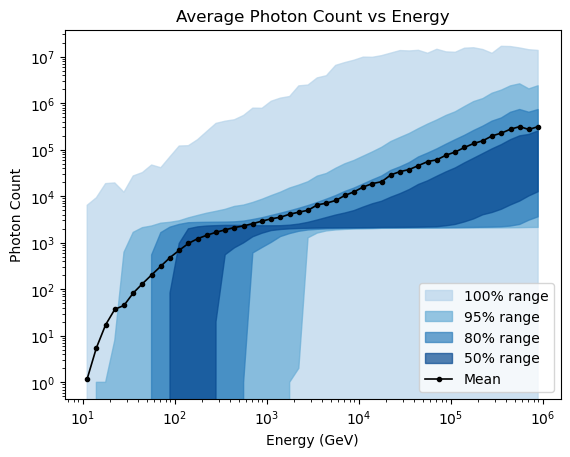

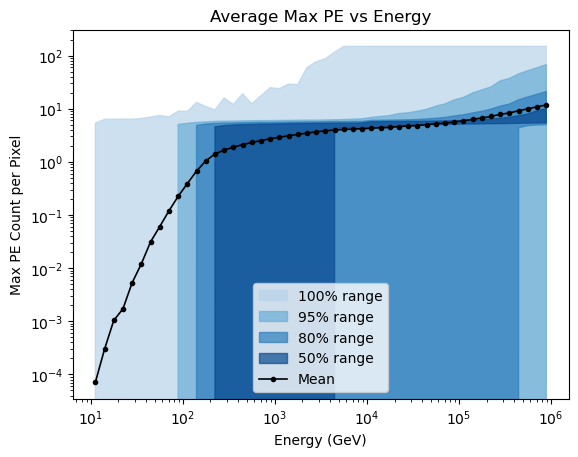

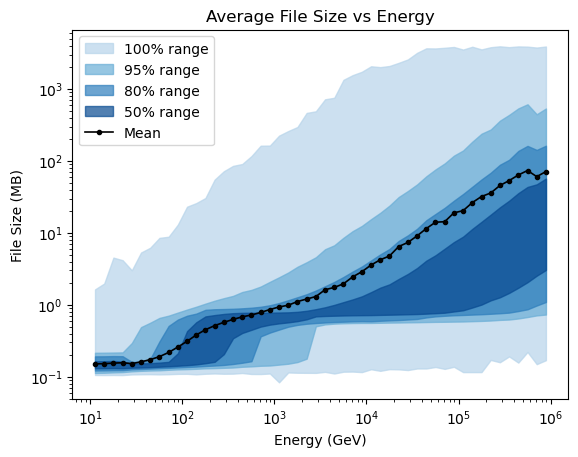

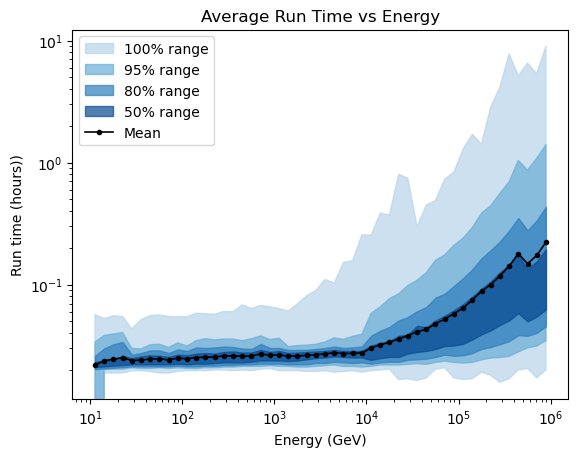

11.793201263094998 TB 4268.6948019655865 photon per MB


In [101]:
#Extract data
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import os
import sys
import math

# ── Configuration ─────────────────────────────────────────────────────────────
PE_THRESHOLD = 20
#N_BOOTSTRAP = 1000
#CI_LEVEL = 0.99
E_MIN_GEV = 1e1
E_MAX_GEV = 1e6
SEEDS = [1,2,3,4,5,6]
PID = 13
RADIUS = 5
BASE_DIR = "/scratch/general/vast/u1520754/muon_sim_chain_tree"


# ── Helper functions ─────────────────────────────────────────────────────────
def load_scan(csv_path: str) -> pd.DataFrame:
    if not os.path.exists(csv_path):
        raise FileNotFoundError(f"CSV not found: {csv_path}")
    df = pd.read_csv(csv_path)
    n_missing = (df["file_found"] == 0).sum()
    if n_missing > 0:
        print(f"  WARNING: {n_missing} rows had file_found=0 and will be dropped.")
        index = (df["file_found"] == 0)
        """print("zenith",set(df["zen"][index]))
        print("azimuth",set(df["az"][index]))
        print("height",set(df["height"][index]))"""
    df = df[df["file_found"] == 1].copy()
    df["r"] = np.sqrt(df["tel_x"]**2 + df["tel_z"]**2).round(4)
    df["detected"] = (df["max_pe"] >= PE_THRESHOLD).astype(float)
    return df

def slant_depth(zem, obs_height, zenith_rad):
    theta = np.pi - zenith_rad
    arg = (obs_height / zem) * np.sin(theta)
    arg = np.clip(arg, -1.0, 1.0)
    beta = np.where(np.isfinite(arg), np.arcsin(arg), 0.0)
    beta = np.clip(beta, 0.0, np.pi/2)
    #beta = np.clip(np.arcsin((obs_height / zem) * np.sin(theta)), 0, np.pi/2)
    alpha = np.pi - theta - beta
    s = zem * np.sin(alpha) / np.sin(theta)
    return np.clip(s, 0, np.inf)
def incidence_angle(Zenith_deg, Azimuth_deg):
    Zenith = Zenith_deg
    Azimuth = Azimuth_deg
    cos_Zenith = np.cos(np.radians(Zenith))
    cos_Azimuth = np.cos(np.radians(Azimuth - 180))
    cos_Incidence = np.sqrt(1 - cos_Zenith**2 - cos_Azimuth**2)
    Incidence = np.degrees(np.arccos(cos_Incidence))
    return Incidence


import re
import os

def get_available_energies(base_dir, pid, radius, e_min_GeV, e_max_GeV):
    """
    Scan BASE_DIR for folders matching the given PID and RADIUS,
    extract energy values, and filter by [e_min_GeV, e_max_GeV].
    Returns sorted list of (energy_GeV, energy_str) tuples.
    """
    pattern = re.compile(
        rf"Muon_pid{pid}_E([0-9]+\.?[0-9]*e[+-]?[0-9]+)_R{radius}$"
    )
    found = {}
    for name in os.listdir(base_dir):
        m = pattern.match(name)
        if m:
            energy_str = m.group(1)
            energy_val = float(energy_str)
            if e_min_GeV <= energy_val <= e_max_GeV:
                found[energy_val] = energy_str

    return sorted(found.items())  # sorted by energy_GeV


available = get_available_energies(BASE_DIR, PID, RADIUS, E_MIN_GEV, E_MAX_GEV)
print(f"Found {len(available)} energy files between {E_MIN_GEV:.0e} and {E_MAX_GEV:.0e} GeV:")
for e_val, e_str in available:
    print(f"  E={e_str} ({e_val:.3e} GeV)")

# ── Load only those files ────────────────────────────────────────────────────
dfs = []
missing_energies = []
for energy_val, energy_str in available:
    for seed in SEEDS:
        csv_path = (f"{BASE_DIR}/Muon_pid{PID}_E{energy_str}_R{RADIUS}/"
                    f"csv_output/scan_care_pid{PID}_E{energy_str}_R{RADIUS}_y0_s{seed}.csv")
        try:
            df_tmp = load_scan(csv_path)
            df_tmp["seed"] = seed
            df_tmp["energy_string"] = energy_str
            df_tmp["energy_GeV"] = energy_val
            dfs.append(df_tmp)
            print(f"  Loaded E={energy_str} seed={seed}: {len(df_tmp)} rows")
        except Exception as e:
            missing_energies.append(energy_str)
            print(f"  ⚠ E={energy_str} seed={seed}: {e}")


df = pd.concat(dfs, ignore_index=True)
print(f"\nMerged: {len(df)} total rows from {len(dfs)} file(s)")
print(f"Energy range: {df['energy_GeV'].min():.1f} – {df['energy_GeV'].max():.1f} GeV")
if missing_energies:
    print(f"Missing energies: {sorted(set(missing_energies))}")

# ── Derived columns ──────────────────────────────────────────────────────────
R = np.array(df["r"]) # m
X = np.array(df["tel_x"]) # m
Z = np.array(df["tel_z"]) # m
H = np.array(df["height"]) # m
Zenith = np.array(df["zen"]) #Degree
Azimuth = np.array(df["az"]) #Degree
Max_PE = np.array(df["max_pe"]) #Photo_electron
Time_at_Max_PE = np.array(df["time_at_max_pe_ns"]) #ns
Avg_PE = np.array(df["avg_pe"]) 
Total_PE = np.array(df["total_pe"])
Energy_GeV = np.array(df["energy_GeV"]) #GeV
Slant = slant_depth(H + 6371e3, 2944 + 6371e3, np.radians(Zenith))/1000 #km
cos_Zenith = np.cos(np.radians(Zenith))
cos_Azimuth = np.cos(np.radians(Azimuth - 180))
cos_Incidence = np.sqrt(1 - cos_Zenith**2 - cos_Azimuth**2)
Incidence = incidence_angle(Zenith, Azimuth) #Degree
#pulse_width = np.array(df["pulse_width_ns"])
#rise_time = np.array(df["rise_time_ns"])
x_mag = np.array(df["correction_x_m"]) #m
y_mag = np.array(df["correction_y_m"]) #m
file_size = np.array(df["file_size_MB"]) #MB
photon_count = np.array(df["cph_photon_count"])
#max_photon_10ns = np.array(df["cph_max_photons_10ns"])
E_list = np.sort(np.array(list(set(Energy_GeV))))
deleted_low_pe = np.array(df["deleted_low_pe"])
runtime_hours = np.array(df["runtime_seconds"])/3600 
File = []
Photon = []
PE = []
Time = []

Total_FIle_Size = np.nansum(file_size)/1000 - np.nansum(file_size[deleted_low_pe==1])/1000#MB to GB

# --- Coverage levels for nested bands ---
coverages = [50, 80, 95, 100]    # percent
cmap = plt.cm.Blues

# Storage for multi-coverage bands: dict[coverage] -> (lows, highs)
file_bands   = {c: ([], []) for c in coverages}
photon_bands = {c: ([], []) for c in coverages}
pe_bands     = {c: ([], []) for c in coverages}
time_bands     = {c: ([], []) for c in coverages}
for energy in E_list:
    mask = (Energy_GeV == energy)&(R==0)

    f  = np.nanmean(file_size[mask])
    p  = np.nanmean(photon_count[mask])
    pe = np.nanmean(Max_PE[mask])
    t = np.nanmean(runtime_hours[mask]) 

    File.append(f)
    Photon.append(p)
    PE.append(pe)
    Time.append(t)
    
    # Multi-coverage percentile bands
    for cov in coverages:
        lo_p = (100 - cov) / 2
        hi_p = 100 - lo_p
        file_bands[cov][0].append(np.nanpercentile(file_size[mask], lo_p))
        file_bands[cov][1].append(np.nanpercentile(file_size[mask], hi_p))
        photon_bands[cov][0].append(np.nanpercentile(photon_count[mask], lo_p))
        photon_bands[cov][1].append(np.nanpercentile(photon_count[mask], hi_p))
        pe_bands[cov][0].append(np.nanpercentile(Max_PE[mask], lo_p))
        pe_bands[cov][1].append(np.nanpercentile(Max_PE[mask], hi_p))
        time_bands[cov][0].append(np.nanpercentile(runtime_hours[mask], lo_p))
        time_bands[cov][1].append(np.nanpercentile(runtime_hours[mask], hi_p))
File   = np.array(File)
Photon = np.array(Photon)
PE     = np.array(PE)
Time   = np.array(Time)

for cov in coverages:
    file_bands[cov]   = (np.array(file_bands[cov][0]),   np.array(file_bands[cov][1]))
    photon_bands[cov] = (np.array(photon_bands[cov][0]), np.array(photon_bands[cov][1]))
    pe_bands[cov]     = (np.array(pe_bands[cov][0]),     np.array(pe_bands[cov][1]))
    time_bands[cov]   = (np.array(time_bands[cov][0]),     np.array(time_bands[cov][1]))

def plot_with_bands(E_list, mean, bands_dict, coverages, ylabel, title):
    fig, ax = plt.subplots()
    # Widest first (lightest), narrowest last (darkest)
    order = sorted(coverages, reverse=True)
    n = len(order)
    for i, cov in enumerate(order):
        lo, hi = bands_dict[cov]
        color = cmap(0.3 + 0.6 * (i / max(1, n - 1)))
        ax.fill_between(E_list, lo, hi, color=color, alpha=0.7,
                        label=f'{cov}% range')
    ax.plot(E_list, mean, 'k.-', lw=1.2, label='Mean')
    ax.set_xscale("log"); ax.set_yscale("log")
    ax.set_xlabel("Energy (GeV)")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend()
    plt.show()


# --- Photon Count Plot ---
plot_with_bands(E_list, Photon, photon_bands, coverages,
                "Photon Count", "Average Photon Count vs Energy")

# --- PE Count Plot ---
plot_with_bands(E_list, PE, pe_bands, coverages,
                "Max PE Count per Pixel", "Average Max PE vs Energy")

plot_with_bands(E_list, File, file_bands, coverages,
                "File Size (MB)", "Average File Size vs Energy")

plot_with_bands(E_list, Time, time_bands, coverages,
                "Run time (hours))", "Average Run Time vs Energy")

print(Total_FIle_Size/1000, "TB", np.nanmean(Photon)/np.nanmean(File), "photon per MB")


Saturation threshold: 200.00


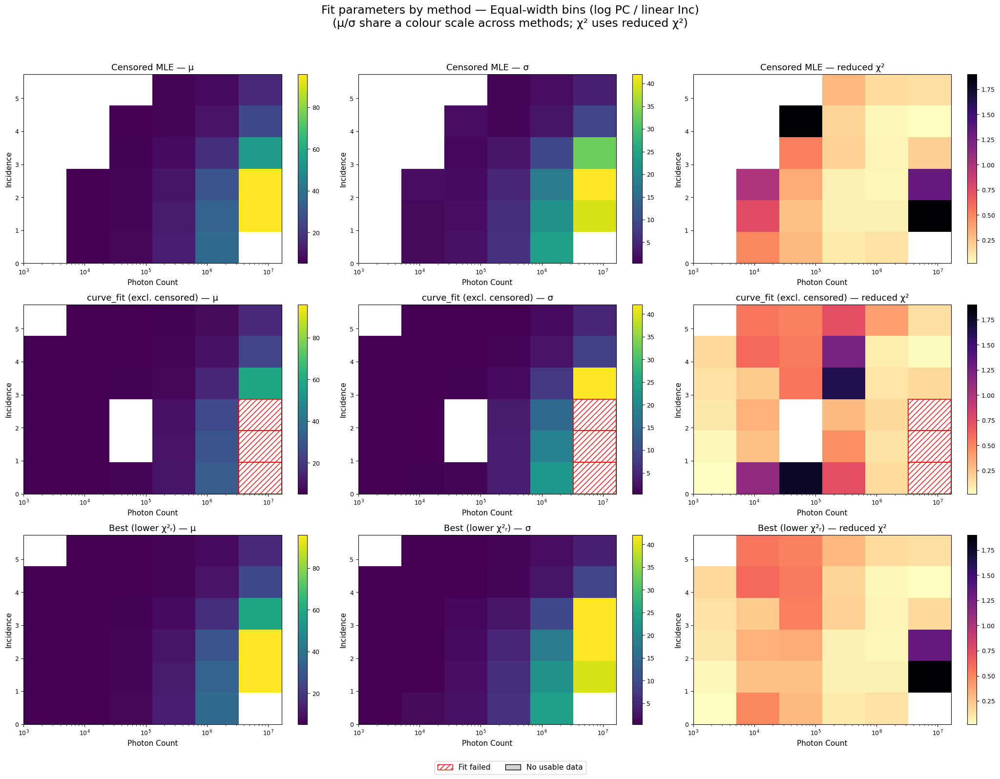

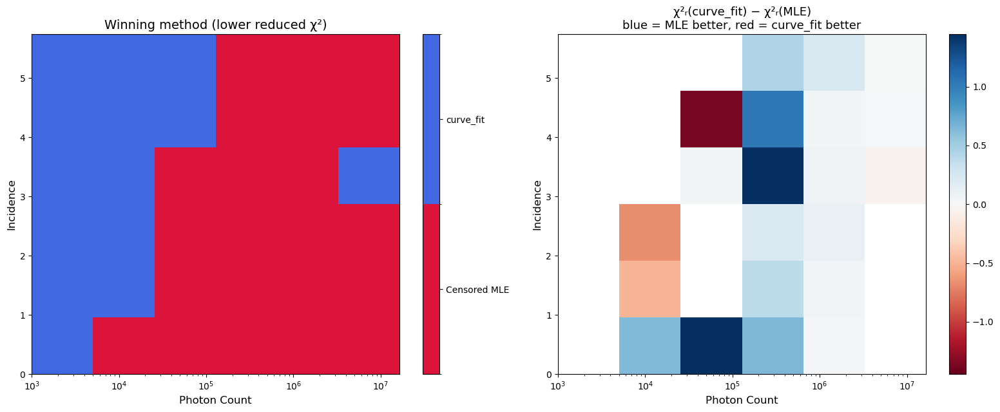

Censored MLE won : 22/36 bins
curve_fit won    : 14/36 bins
No usable data   : 0 bins


In [102]:
import numpy as np
from scipy.optimize import minimize, approx_fprime, curve_fit
from scipy.stats import norm
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, Patch

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.io as pio
pio.renderers.default = "notebook"

# =====================================================================
# SETUP
# =====================================================================
n_bins = 6
MIN_MU = 5
MAX_MU = 150
MIN_SIGMA = 1e-1
MAX_SIGMA = 150
MAX_CHI2 = 2
EQUAL_COUNT_BINS = False

overall_mask = (photon_count >= 1e3) & (R == 0)
pc  = photon_count[overall_mask]
inc = Incidence[overall_mask]
pe  = Max_PE[overall_mask]

PE_MIN_VALID   = 1
PE_SATURATION  = 200
print(f"Saturation threshold: {PE_SATURATION:.2f}")

if EQUAL_COUNT_BINS:
    pc_bin_edges  = np.unique(np.quantile(pc,  np.linspace(0, 1, n_bins + 1)))
    inc_bin_edges = np.unique(np.quantile(inc, np.linspace(0, 1, n_bins + 1)))
    n_bins_pc  = len(pc_bin_edges) - 1
    n_bins_inc = len(inc_bin_edges) - 1
else:
    pc_bin_edges  = np.logspace(np.log10(pc.min()), np.log10(pc.max()), n_bins + 1)
    inc_bin_edges = np.linspace(inc.min(), inc.max(), n_bins + 1)
    n_bins_pc  = n_bins
    n_bins_inc = n_bins

N_LOG_BINS = 20   # histogram bins used for BOTH methods' chi2 (log domain)

# =====================================================================
# STORAGE  — one set of grids per method, plus a "best" set
# =====================================================================
def _nan_grid():
    return np.full((n_bins_inc, n_bins_pc), np.nan)

grids = {}
for m in ('mle', 'cf', 'best'):
    grids[m] = dict(
        mu=_nan_grid(), sigma=_nan_grid(), chi2=_nan_grid(),
        mu_err=_nan_grid(), sigma_err=_nan_grid(),
    )

# Which method won each cell: 0 = MLE, 1 = curve_fit, -1 = neither
winner_grid = np.full((n_bins_inc, n_bins_pc), -1, dtype=int)

fit_failed_mask = {m: np.zeros((n_bins_inc, n_bins_pc), dtype=bool) for m in ('mle', 'cf')}
no_data_mask    = np.zeros((n_bins_inc, n_bins_pc), dtype=bool)

panel_data = [[None for _ in range(n_bins_pc)] for _ in range(n_bins_inc)]

# =====================================================================
# HELPERS
# =====================================================================
def chi_square_reduced(observed, expected, n_params, threshold_frac=1e-3):
    """Reduced chi2 on a density histogram. Bins with negligible expected
    density are dropped to avoid division blow-up."""
    if expected.size == 0 or np.max(expected) <= 0:
        return np.nan
    thr = threshold_frac * np.max(expected)
    m = expected > thr
    ndof = int(np.sum(m)) - n_params
    if ndof < 1:
        return np.nan
    return np.sum((observed[m] - expected[m]) ** 2 / expected[m]) / ndof


def censored_lognormal_nll(params, log_pe_mid, n_left, n_right, log_L, log_U):
    mu, log_sigma = params
    sigma = np.exp(log_sigma)
    if sigma <= 0 or not np.isfinite(sigma):
        return np.inf
    nll = 0.0
    if len(log_pe_mid) > 0:
        z = (log_pe_mid - mu) / sigma
        nll -= np.sum(norm.logpdf(z) - log_sigma)
    if n_left > 0:
        nll -= n_left * norm.logcdf((log_L - mu) / sigma)
    if n_right > 0:
        nll -= n_right * norm.logsf((log_U - mu) / sigma)
    return nll


def fit_censored_lognormal(pe_raw, pe_min, pe_sat):
    """Censored MLE. Returns dict with log-space and linear-space params."""
    log_L, log_U = np.log(pe_min), np.log(pe_sat)
    left  = pe_raw <= pe_min
    right = pe_raw >= pe_sat
    mid   = ~left & ~right

    n_left, n_right = int(left.sum()), int(right.sum())
    log_mid = np.log(pe_raw[mid])
    n_mid = len(log_mid)

    out = dict(ok=False, log_mu=np.nan, log_sigma=np.nan,
               mu=np.nan, sigma=np.nan, mu_err=np.nan, sigma_err=np.nan,
               n_left=n_left, n_right=n_right, n_mid=n_mid)
    if n_mid < 2:
        return out

    mu0 = np.mean(log_mid)
    s0  = max(np.std(log_mid), 1e-3)

    res = minimize(censored_lognormal_nll, x0=[mu0, np.log(s0)],
                   args=(log_mid, n_left, n_right, log_L, log_U),
                   method='Nelder-Mead',
                   options={'xatol': 1e-8, 'fatol': 1e-8, 'maxiter': 5000})
    if not res.success:
        return out

    log_mu, log_s_param = res.x
    log_sigma = np.exp(log_s_param)

    mu_err_log = sigma_err_log = np.nan
    try:
        eps = 1e-5
        f = lambda p: censored_lognormal_nll(p, log_mid, n_left, n_right, log_L, log_U)
        hess = np.zeros((2, 2))
        g0 = approx_fprime(res.x, f, eps)
        for k in range(2):
            xp = res.x.copy(); xp[k] += eps
            hess[:, k] = (approx_fprime(xp, f, eps) - g0) / eps
        cov = np.linalg.inv(hess)
        if cov[0, 0] > 0:
            mu_err_log = np.sqrt(cov[0, 0])
        if cov[1, 1] > 0:
            sigma_err_log = log_sigma * np.sqrt(cov[1, 1])
    except Exception:
        pass

    mu_lin    = np.exp(log_mu)
    sigma_lin = mu_lin * abs(log_sigma)
    mu_lin_err = mu_lin * mu_err_log if np.isfinite(mu_err_log) else np.nan
    if np.isfinite(sigma_err_log) and np.isfinite(mu_err_log):
        sigma_lin_err = mu_lin * np.sqrt(sigma_err_log**2 + (log_sigma * mu_err_log)**2)
    else:
        sigma_lin_err = np.nan

    out.update(ok=True, log_mu=log_mu, log_sigma=log_sigma,
               mu=mu_lin, sigma=sigma_lin,
               mu_err=mu_lin_err, sigma_err=sigma_lin_err)
    return out


def _gauss(x, mu, sigma, A):
    return A * np.exp(-(x - mu) ** 2 / (2.0 * sigma ** 2))


def fit_curvefit_lognormal(pe_mid, log_counts, log_centers):
    """Legacy approach: least-squares Gaussian to the log-domain histogram,
    built ONLY from uncensored data (0 and saturation excluded)."""
    out = dict(ok=False, log_mu=np.nan, log_sigma=np.nan,
               mu=np.nan, sigma=np.nan, mu_err=np.nan, sigma_err=np.nan)
    if len(pe_mid) < 10 or log_counts.size == 0:
        return out
    lg = np.log(pe_mid)
    p0 = [np.mean(lg), max(np.std(lg), 1e-3), max(log_counts.max(), 1e-9)]
    try:
        popt, pcov = curve_fit(_gauss, log_centers, log_counts, p0=p0, maxfev=20000)
        log_mu, log_sigma, _A = popt
        log_sigma = abs(log_sigma)
        if not np.isfinite(log_mu) or log_sigma <= 0:
            return out
        perr = np.sqrt(np.diag(pcov)) if pcov is not None else [np.nan]*3
        mu_err_log, sigma_err_log = perr[0], perr[1]

        mu_lin    = np.exp(log_mu)
        sigma_lin = mu_lin * log_sigma
        mu_lin_err = mu_lin * mu_err_log if np.isfinite(mu_err_log) else np.nan
        if np.isfinite(sigma_err_log) and np.isfinite(mu_err_log):
            sigma_lin_err = mu_lin * np.sqrt(sigma_err_log**2 + (log_sigma*mu_err_log)**2)
        else:
            sigma_lin_err = np.nan

        out.update(ok=True, log_mu=log_mu, log_sigma=log_sigma,
                   mu=mu_lin, sigma=sigma_lin,
                   mu_err=mu_lin_err, sigma_err=sigma_lin_err)
    except Exception:
        pass
    return out

# =====================================================================
# FITTING LOOP — both methods on every cell
# =====================================================================
for i in range(n_bins_pc):
    for j in range(n_bins_inc):

        pc_hi  = (pc  <= pc_bin_edges[i+1])  if i == n_bins_pc-1  else (pc  < pc_bin_edges[i+1])
        inc_hi = (inc <= inc_bin_edges[j+1]) if j == n_bins_inc-1 else (inc < inc_bin_edges[j+1])
        bm = (pc >= pc_bin_edges[i]) & pc_hi & (inc >= inc_bin_edges[j]) & inc_hi

        pe_raw = pe[bm]
        n_raw  = len(pe_raw)

        left_mask  = pe_raw <= PE_MIN_VALID
        right_mask = pe_raw >= PE_SATURATION
        mid_mask   = ~left_mask & ~right_mask
        pe_mid     = pe_raw[mid_mask]
        n_left, n_right, n_mid = int(left_mask.sum()), int(right_mask.sum()), len(pe_mid)

        if n_mid < 2:
            no_data_mask[j, i] = True
            panel_data[j][i] = dict(status='nodata', n_raw=n_raw,
                                    n_left=n_left, n_right=n_right, n_mid=n_mid,
                                    lin_x=np.array([]), lin_y=np.array([]), lin_w=np.array([]),
                                    mle=None, cf=None, winner=-1)
            continue

        # ---- Shared log-domain histogram (chi2 reference for BOTH methods) ----
        log_mid = np.log(pe_mid)
        log_counts, log_edges = np.histogram(log_mid, bins=N_LOG_BINS, density=True)
        log_centers = 0.5 * (log_edges[1:] + log_edges[:-1])

        # ---- Linear-domain histogram for display ----
        lin_edges = np.linspace(0.0, PE_SATURATION, 41)
        lin_counts, _ = np.histogram(pe_mid, bins=lin_edges, density=True)
        lin_centers = 0.5 * (lin_edges[1:] + lin_edges[:-1])
        lin_widths  = np.diff(lin_edges)

        # ---- Method A: censored MLE ----
        mle = fit_censored_lognormal(pe_raw, PE_MIN_VALID, PE_SATURATION)
        if mle['ok']:
            exp_mle = norm.pdf(log_centers, loc=mle['log_mu'], scale=mle['log_sigma'])
            mle['chi2'] = chi_square_reduced(log_counts, exp_mle, n_params=2)
        else:
            mle['chi2'] = np.nan
            fit_failed_mask['mle'][j, i] = True

        # ---- Method B: curve_fit on censored-out histogram ----
        cf = fit_curvefit_lognormal(pe_mid, log_counts, log_centers)
        if cf['ok']:
            exp_cf = norm.pdf(log_centers, loc=cf['log_mu'], scale=cf['log_sigma'])
            cf['chi2'] = chi_square_reduced(log_counts, exp_cf, n_params=3)
        else:
            cf['chi2'] = np.nan
            fit_failed_mask['cf'][j, i] = True

        # ---- Store per-method grids ----
        for key, r in (('mle', mle), ('cf', cf)):
            if r['ok']:
                grids[key]['mu'][j, i]        = r['mu']
                grids[key]['sigma'][j, i]     = r['sigma']
                grids[key]['chi2'][j, i]      = r['chi2']
                grids[key]['mu_err'][j, i]    = r['mu_err']
                grids[key]['sigma_err'][j, i] = r['sigma_err']

        # ---- Pick winner by lower reduced chi2 ----
        c_mle = mle['chi2'] if (mle['ok'] and np.isfinite(mle['chi2'])) else np.inf
        c_cf  = cf['chi2']  if (cf['ok']  and np.isfinite(cf['chi2']))  else np.inf
        if np.isinf(c_mle) and np.isinf(c_cf):
            win, best = -1, None
        elif c_mle <= c_cf:
            win, best = 0, mle
        else:
            win, best = 1, cf

        if best is not None:
            winner_grid[j, i] = win
            grids['best']['mu'][j, i]        = best['mu']
            grids['best']['sigma'][j, i]     = best['sigma']
            grids['best']['chi2'][j, i]      = best['chi2']
            grids['best']['mu_err'][j, i]    = best['mu_err']
            grids['best']['sigma_err'][j, i] = best['sigma_err']

        # ---- Curves for display (linear domain) ----
        xs = np.linspace(max(PE_MIN_VALID, 1e-6), PE_SATURATION, 400)
        def _curve(r):
            if r is None or not r['ok']:
                return np.array([])
            return norm.pdf(np.log(xs), loc=r['log_mu'], scale=r['log_sigma']) / xs

        panel_data[j][i] = dict(
            status='ok', n_raw=n_raw,
            n_left=n_left, n_right=n_right, n_mid=n_mid,
            lin_x=lin_centers, lin_y=lin_counts, lin_w=lin_widths,
            curve_x=xs, curve_mle=_curve(mle), curve_cf=_curve(cf),
            mle=mle, cf=cf, winner=win,
        )

# ---- Clip extremes so colour scales stay readable ----
for key in ('mle', 'cf', 'best'):
    g = grids[key]
    g['mu'][(g['mu'] >= MAX_MU) | (g['mu'] <= MIN_MU) | (g['chi2'] >= MAX_CHI2)] = np.nan
    g['sigma'][(g['sigma'] >= MAX_SIGMA) | (g['sigma'] <= MIN_SIGMA) | (g['chi2'] >= MAX_CHI2)] = np.nan
    g['chi2'][g['chi2'] >= MAX_CHI2] = np.nan

bin_mode_str = "Equal-count (quantile) bins" if EQUAL_COUNT_BINS else "Equal-width bins (log PC / linear Inc)"

# =====================================================================
# PLOTLY: slider over incidence, panels over PC
#   6 traces per panel: hist, censored-left, censored-right, MLE, CF
# =====================================================================
n_cols = int(np.ceil(np.sqrt(n_bins_pc)))
n_rows = int(np.ceil(n_bins_pc / n_cols))

subplot_titles = [f"PC:[{pc_bin_edges[i]:.1e}, {pc_bin_edges[i+1]:.1e}]"
                  for i in range(n_bins_pc)]
subplot_titles += [""] * (n_rows * n_cols - n_bins_pc)

fig_pl = make_subplots(rows=n_rows, cols=n_cols,
                       subplot_titles=subplot_titles,
                       horizontal_spacing=0.05, vertical_spacing=0.12)

C_MLE, C_CF = 'crimson', 'royalblue'
TRACES_PER_PANEL = 5
trace_owner = []

for j in range(n_bins_inc):
    for i in range(n_bins_pc):
        r, c = i // n_cols + 1, i % n_cols + 1
        d = panel_data[j][i]
        vis = (j == 0)
        first = (j == 0 and i == 0)

        if d is None or d['status'] == 'nodata':
            for _ in range(TRACES_PER_PANEL):
                fig_pl.add_trace(go.Scatter(x=[], y=[], showlegend=False, visible=vis),
                                 row=r, col=c)
                trace_owner.append(j)
            continue

        ymax = max(d['lin_y'].max() if d['lin_y'].size else 0.0,
                   d['curve_mle'].max() if d['curve_mle'].size else 0.0,
                   d['curve_cf'].max() if d['curve_cf'].size else 0.0, 1e-9)
        fL = d['n_left']  / max(d['n_raw'], 1)
        fR = d['n_right'] / max(d['n_raw'], 1)
        wsp = float(np.median(d['lin_w'])) * 0.9

        # 1. uncensored histogram
        fig_pl.add_trace(go.Bar(
            x=d['lin_x'], y=d['lin_y'], width=d['lin_w'],
            marker=dict(color='lightsteelblue'), opacity=0.65,
            name='Data (uncensored)', legendgroup='data', showlegend=first, visible=vis,
            hovertemplate="Max_PE=%{x:.3g}<br>density=%{y:.3g}<extra></extra>",
        ), row=r, col=c); trace_owner.append(j)

        # 2. left-censored pile
        fig_pl.add_trace(go.Bar(
            x=[0.0], y=[fL * ymax], width=wsp,
            marker=dict(color='dimgray'), opacity=0.9,
            name='Censored @ 0', legendgroup='cenL', showlegend=first, visible=vis,
            hovertemplate=f"zero/below-threshold<br>N={d['n_left']} ({100*fL:.1f}%)<extra></extra>",
        ), row=r, col=c); trace_owner.append(j)

        # 3. right-censored pile
        fig_pl.add_trace(go.Bar(
            x=[PE_SATURATION], y=[fR * ymax], width=wsp,
            marker=dict(color='darkorange'), opacity=0.9,
            name='Censored @ saturation', legendgroup='cenR', showlegend=first, visible=vis,
            hovertemplate=f"saturated<br>N={d['n_right']} ({100*fR:.1f}%)<extra></extra>",
        ), row=r, col=c); trace_owner.append(j)

        # 4. censored-MLE curve
        fig_pl.add_trace(go.Scatter(
            x=d['curve_x'], y=d['curve_mle'], mode='lines',
            line=dict(color=C_MLE, width=2.2),
            name='Censored MLE', legendgroup='mle', showlegend=first, visible=vis,
            hovertemplate="Max_PE=%{x:.3g}<br>pdf=%{y:.3g}<extra></extra>",
        ), row=r, col=c); trace_owner.append(j)

        # 5. curve_fit curve
        fig_pl.add_trace(go.Scatter(
            x=d['curve_x'], y=d['curve_cf'], mode='lines',
            line=dict(color=C_CF, width=2.2, dash='dash'),
            name='curve_fit (excl. censored)', legendgroup='cf', showlegend=first, visible=vis,
            hovertemplate="Max_PE=%{x:.3g}<br>pdf=%{y:.3g}<extra></extra>",
        ), row=r, col=c); trace_owner.append(j)

trace_owner = np.array(trace_owner)
base_annotations = list(fig_pl.layout.annotations)


def make_annotations_for_inc(j):
    anns = [a.to_plotly_json() for a in base_annotations]
    for i in range(n_bins_pc):
        d = panel_data[j][i]
        ai = i + 1
        xref = 'x domain' if ai == 1 else f'x{ai} domain'
        yref = 'y domain' if ai == 1 else f'y{ai} domain'

        if d is None or d['status'] == 'nodata':
            txt, col = "No valid data", 'gray'
        else:
            def fmt(r):
                if r is None or not r['ok']:
                    return "fail"
                c2 = f"{r['chi2']:.1e}" if np.isfinite(r['chi2']) else "n/a"
                return f"μ={r['mu']:.1e} σ={r['sigma']:.1e} χ²ᵣ={c2}"
            w = d['winner']
            star_m = "★ " if w == 0 else "&nbsp;&nbsp;"
            star_c = "★ " if w == 1 else "&nbsp;&nbsp;"
            txt = (f"<span style='color:{C_MLE}'>{star_m}MLE  {fmt(d['mle'])}</span><br>"
                   f"<span style='color:{C_CF}'>{star_c}CF   {fmt(d['cf'])}</span><br>"
                   f"<span style='color:#444'>N={d['n_mid']} L={d['n_left']} R={d['n_right']}</span>")
            col = C_MLE if w == 0 else (C_CF if w == 1 else 'gray')

        anns.append(dict(x=0.98, y=0.97, xref=xref, yref=yref,
                         xanchor='right', yanchor='top', text=txt,
                         showarrow=False, font=dict(size=8), align='right',
                         bgcolor='rgba(255,255,255,0.78)',
                         bordercolor=col, borderwidth=1.2, borderpad=2))
    return anns


for i in range(n_bins_pc):
    r, c = i // n_cols + 1, i % n_cols + 1
    fig_pl.update_xaxes(type='linear', range=[-4, PE_SATURATION * 1.08],
                        title_text="Max_PE", title_font=dict(size=9),
                        tickfont=dict(size=8), row=r, col=c)
    fig_pl.update_yaxes(title_text="density", title_font=dict(size=9),
                        tickfont=dict(size=8), row=r, col=c)

def _title(j):
    return (f"Max_PE: Censored MLE vs curve_fit<br>"
            f"<sub>Incidence [{inc_bin_edges[j]:.3f}, {inc_bin_edges[j+1]:.3f}] "
            f"&nbsp;|&nbsp; {bin_mode_str} "
            f"&nbsp;|&nbsp; saturation={PE_SATURATION:.1f} "
            f"&nbsp;|&nbsp; ★ = lower reduced χ²</sub>")

steps = [dict(method='update',
              label=f"{inc_bin_edges[j]:.2f}–{inc_bin_edges[j+1]:.2f}",
              args=[{'visible': (trace_owner == j).tolist()},
                    {'annotations': make_annotations_for_inc(j),
                     'title.text': _title(j)}])
         for j in range(n_bins_inc)]

fig_pl.update_layout(
    annotations=make_annotations_for_inc(0),
    sliders=[dict(active=0,
                  currentvalue=dict(prefix="Incidence bin: ", font=dict(size=13)),
                  pad=dict(t=55, b=10), steps=steps)],
    title=dict(text=_title(0), x=0.5, xanchor='center'),
    height=780, width=1300, autosize=True, bargap=0,
    template='plotly_white', margin=dict(t=150, b=95),
    legend=dict(orientation='h', yanchor='bottom', y=1.02,
                xanchor='center', x=0.5, font=dict(size=10)),
)
for a in fig_pl.layout.annotations[:len(base_annotations)]:
    a.font = dict(size=10)

fig_pl.write_html("maxpe_method_comparison.html", include_plotlyjs='cdn',
                  config={'responsive': True})
fig_pl.show()

# =====================================================================
# HEATMAPS — 3 rows (MLE / curve_fit / best) x 3 cols (mu / sigma / chi2)
# =====================================================================
def shared_limits(*gs):
    v = np.concatenate([g[np.isfinite(g)].ravel() for g in gs if np.any(np.isfinite(g))])
    if v.size == 0:
        return None, None
    return np.nanpercentile(v, 2), np.nanpercentile(v, 98)

lim_mu    = shared_limits(grids['mle']['mu'],    grids['cf']['mu'])
lim_sigma = shared_limits(grids['mle']['sigma'], grids['cf']['sigma'])
lim_chi2  = shared_limits(grids['mle']['chi2'],  grids['cf']['chi2'])

row_defs = [('mle', 'Censored MLE'), ('cf', 'curve_fit (excl. censored)'), ('best', 'Best (lower χ²ᵣ)')]
col_defs = [('mu', 'μ', lim_mu, 'viridis'),
            ('sigma', 'σ', lim_sigma, 'viridis'),
            ('chi2', 'reduced χ²', lim_chi2, 'magma_r')]

fig, axes = plt.subplots(3, 3, figsize=(21, 16))

for ri, (mkey, mlabel) in enumerate(row_defs):
    for ci, (pkey, plabel, lims, cmap) in enumerate(col_defs):
        ax = axes[ri, ci]
        g = grids[mkey][pkey]
        pcm = ax.pcolormesh(pc_bin_edges, inc_bin_edges, g, shading='auto',
                            cmap=cmap, vmin=lims[0], vmax=lims[1])
        ax.set_xscale('log')
        ax.set_xlabel("Photon Count", fontsize=11)
        ax.set_ylabel("Incidence", fontsize=11)
        ax.set_title(f"{mlabel} — {plabel}", fontsize=13)
        ax.tick_params(labelsize=9)
        cb = fig.colorbar(pcm, ax=ax); cb.ax.tick_params(labelsize=9)

        # mark failures / no-data
        for i in range(n_bins_pc):
            for j in range(n_bins_inc):
                rect_kw = dict(width=pc_bin_edges[i+1]-pc_bin_edges[i],
                               height=inc_bin_edges[j+1]-inc_bin_edges[j])
                if no_data_mask[j, i]:
                    ax.add_patch(Rectangle((pc_bin_edges[i], inc_bin_edges[j]),
                                           facecolor='lightgray', edgecolor='black',
                                           linewidth=0.8, **rect_kw))
                elif mkey in fit_failed_mask and fit_failed_mask[mkey][j, i]:
                    ax.add_patch(Rectangle((pc_bin_edges[i], inc_bin_edges[j]),
                                           fill=False, hatch='///', edgecolor='red',
                                           linewidth=1.2, **rect_kw))

fig.legend(handles=[Patch(facecolor='none', edgecolor='red', hatch='///', label='Fit failed'),
                    Patch(facecolor='lightgray', edgecolor='black', label='No usable data')],
           loc='lower center', ncol=2, fontsize=11, bbox_to_anchor=(0.5, -0.01))
fig.suptitle(f"Fit parameters by method — {bin_mode_str}\n"
             f"(μ/σ share a colour scale across methods; χ² uses reduced χ²)", fontsize=17)
plt.tight_layout(rect=[0, 0.02, 1, 0.955])
plt.savefig("heatmaps_method_comparison.png", dpi=150)
plt.show()

# =====================================================================
# WINNER MAP + chi2 difference — the "which method where" summary
# =====================================================================
from matplotlib.colors import ListedColormap, BoundaryNorm, TwoSlopeNorm

fig2, (axA, axB) = plt.subplots(1, 2, figsize=(16, 6.5))

wmap = np.where(winner_grid < 0, np.nan, winner_grid).astype(float)
cmap_w = ListedColormap([C_MLE, C_CF])
pcm = axA.pcolormesh(pc_bin_edges, inc_bin_edges, wmap, shading='auto',
                     cmap=cmap_w, norm=BoundaryNorm([-0.5, 0.5, 1.5], 2))
axA.set_xscale('log')
axA.set_xlabel("Photon Count", fontsize=12); axA.set_ylabel("Incidence", fontsize=12)
axA.set_title("Winning method (lower reduced χ²)", fontsize=14)
cb = fig2.colorbar(pcm, ax=axA, ticks=[0, 1])
cb.ax.set_yticklabels(['Censored MLE', 'curve_fit'])

dchi = grids['cf']['chi2'] - grids['mle']['chi2']   # >0 => MLE better
lim = np.nanpercentile(np.abs(dchi[np.isfinite(dchi)]), 95) if np.any(np.isfinite(dchi)) else 1.0
pcm2 = axB.pcolormesh(pc_bin_edges, inc_bin_edges, dchi, shading='auto',
                      cmap='RdBu', norm=TwoSlopeNorm(vmin=-lim, vcenter=0, vmax=lim))
axB.set_xscale('log')
axB.set_xlabel("Photon Count", fontsize=12); axB.set_ylabel("Incidence", fontsize=12)
axB.set_title("χ²ᵣ(curve_fit) − χ²ᵣ(MLE)\nblue = MLE better, red = curve_fit better", fontsize=13)
fig2.colorbar(pcm2, ax=axB)

plt.tight_layout()
plt.savefig("method_winner_map.png", dpi=150)
plt.show()

# =====================================================================
# CONVENIENCE ALIASES — 'best' results in the old variable names
# =====================================================================
mu_grid        = grids['best']['mu']
sigma_grid     = grids['best']['sigma']
chi2_grid      = grids['best']['chi2']
mu_err_grid    = grids['best']['mu_err']
sigma_err_grid = grids['best']['sigma_err']

n_tot = int(np.sum(winner_grid >= 0))
if n_tot:
    print(f"Censored MLE won : {int(np.sum(winner_grid==0))}/{n_tot} bins")
    print(f"curve_fit won    : {int(np.sum(winner_grid==1))}/{n_tot} bins")
print(f"No usable data   : {int(no_data_mask.sum())} bins")

Flattened 657 usable cells out of 900


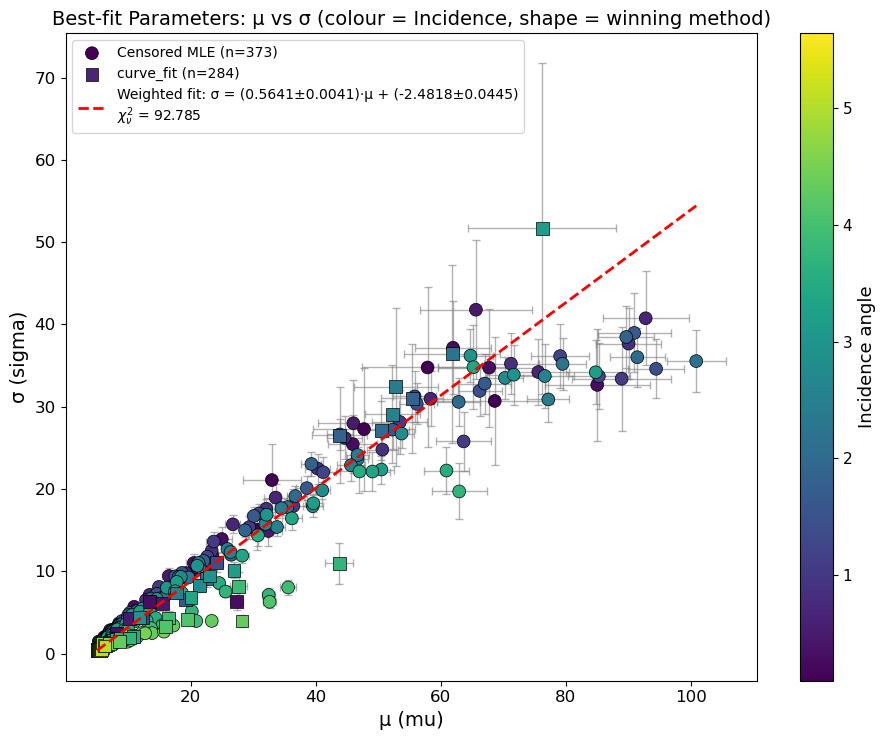

Weighted linear fit: sigma = (0.5641 ± 0.0041) * mu + (-2.4818 ± 0.0445)
Reduced chi^2 = 92.7855   (N=657, dof=655)


In [13]:
# FLATTEN 'best' GRIDS -> 1D ARRAYS for the mu-sigma scatter/fit
# =====================================================================
inc_bin_centers = 0.5 * (inc_bin_edges[:-1] + inc_bin_edges[1:])
pc_bin_centers  = np.sqrt(pc_bin_edges[:-1] * pc_bin_edges[1:])  # geometric: PC bins are log-spaced

mu_flat, sigma_flat = [], []
mu_err_flat, sigma_err_flat = [], []
inc_flat, pc_flat, chi2_flat, winner_flat = [], [], [], []

for i in range(n_bins_pc):
    for j in range(n_bins_inc):
        if no_data_mask[j, i] or winner_grid[j, i] < 0:
            continue
        m = mu_grid[j, i]
        s = sigma_grid[j, i]
        if not (np.isfinite(m) and np.isfinite(s)):
            continue

        mu_flat.append(m)
        sigma_flat.append(s)
        mu_err_flat.append(mu_err_grid[j, i]       if np.isfinite(mu_err_grid[j, i])    else 0.0)
        sigma_err_flat.append(sigma_err_grid[j, i] if np.isfinite(sigma_err_grid[j, i]) else 0.0)
        inc_flat.append(inc_bin_centers[j])
        pc_flat.append(pc_bin_centers[i])
        chi2_flat.append(chi2_grid[j, i])
        winner_flat.append(winner_grid[j, i])

mu_flat        = np.asarray(mu_flat)
sigma_flat     = np.asarray(sigma_flat)
mu_err_flat    = np.asarray(mu_err_flat)
sigma_err_flat = np.asarray(sigma_err_flat)
inc_flat       = np.asarray(inc_flat)
pc_flat        = np.asarray(pc_flat)
chi2_flat      = np.asarray(chi2_flat)
winner_flat    = np.asarray(winner_flat)

print(f"Flattened {len(mu_flat)} usable cells out of {n_bins_pc*n_bins_inc}")

# Floor zero/missing sigma errors so weighting doesn't blow up
nz = sigma_err_flat[sigma_err_flat > 0]
floor_val = np.nanmedian(nz) if nz.size else 1.0
sigma_err_safe = np.where(sigma_err_flat > 0, sigma_err_flat, floor_val)

# =====================================================================
# WEIGHTED LINEAR FIT  sigma = a*mu + b
# =====================================================================
def linfunc(x, a, b):
    return a * x + b

popt, pcov = curve_fit(linfunc, mu_flat, sigma_flat,
                       sigma=chi2_flat, absolute_sigma=False)
a_fit, b_fit = popt
a_err, b_err = np.sqrt(np.diag(pcov))

mu_line    = np.linspace(mu_flat.min(), mu_flat.max(), 200)
sigma_line = linfunc(mu_line, a_fit, b_fit)

sigma_pred = linfunc(mu_flat, a_fit, b_fit)
chi2_lin   = np.sum(((sigma_flat - sigma_pred) / sigma_err_safe) ** 2)
dof        = len(mu_flat) - 2
chi2_red   = chi2_lin / dof if dof > 0 else np.nan

# =====================================================================
# PLOT
# =====================================================================
fig, ax = plt.subplots(figsize=(9.5, 7.5))

ax.errorbar(mu_flat, sigma_flat, xerr=mu_err_flat, yerr=sigma_err_flat,
            fmt='none', ecolor='gray', elinewidth=1, capsize=3, alpha=0.6, zorder=2)

# marker shape encodes which method won that cell
for w, mk, lbl in ((0, 'o', 'Censored MLE'), (1, 's', 'curve_fit')):
    sel = winner_flat == w
    if not np.any(sel):
        continue
    ax.scatter(mu_flat[sel], sigma_flat[sel], c=inc_flat[sel], cmap='viridis',
               vmin=inc_flat.min(), vmax=inc_flat.max(),
               s=85, marker=mk, edgecolor='k', linewidth=0.5,
               zorder=3, label=f"{lbl} (n={sel.sum()})")

sc = ax.scatter([], [], c=[], cmap='viridis',
                vmin=inc_flat.min(), vmax=inc_flat.max())  # colorbar proxy

ax.plot(mu_line, sigma_line, 'r--', linewidth=2, zorder=4,
        label=(f"Weighted fit: σ = ({a_fit:.4f}±{a_err:.4f})·μ + ({b_fit:.4f}±{b_err:.4f})\n"
               f"$\\chi^2_\\nu$ = {chi2_red:.3f}"))

ax.set_xlabel("μ (mu)", fontsize=14)
ax.set_ylabel("σ (sigma)", fontsize=14)
ax.set_title("Best-fit Parameters: μ vs σ (colour = Incidence, shape = winning method)",
             fontsize=14)
ax.tick_params(axis='both', labelsize=12)
ax.legend(fontsize=10, loc='best')

cbar = fig.colorbar(sc, ax=ax)
cbar.set_label("Incidence angle", fontsize=13)
cbar.ax.tick_params(labelsize=11)

#ax.set_xscale('log')
#ax.set_yscale('log')

plt.tight_layout()
plt.savefig("mu_sigma_scatter_by_incidence.png", dpi=150)
plt.show()

print(f"Weighted linear fit: sigma = ({a_fit:.4f} ± {a_err:.4f}) * mu + ({b_fit:.4f} ± {b_err:.4f})")
print(f"Reduced chi^2 = {chi2_red:.4f}   (N={len(mu_flat)}, dof={dof})")

Incidence=0.096: B=1.6e-07±5.2e-09, C=3.5e-02±7.6e-05, chi2_red=5.1946
Incidence=0.287: B=1.6e-07±3.0e-09, C=3.6e-02±4.6e-05, chi2_red=6.8787
Incidence=0.478: B=1.6e-07±3.9e-09, C=3.6e-02±6.2e-05, chi2_red=7.4741
Incidence=0.669: B=2.0e-07±2.7e-09, C=3.5e-02±3.7e-05, chi2_red=5.9715
Incidence=0.860: B=1.8e-07±2.1e-09, C=3.5e-02±3.8e-05, chi2_red=2.9741
Incidence=1.052: B=1.7e-07±3.0e-09, C=3.5e-02±5.0e-05, chi2_red=2.7797
Incidence=1.243: B=1.6e-07±1.9e-09, C=3.5e-02±3.3e-05, chi2_red=8.8732
Incidence=1.434: B=1.6e-07±1.8e-09, C=3.5e-02±3.4e-05, chi2_red=7.1033
Incidence=1.625: B=1.6e-07±1.9e-09, C=3.5e-02±4.0e-05, chi2_red=5.8332
Incidence=1.816: B=1.6e-07±1.5e-09, C=3.5e-02±3.4e-05, chi2_red=6.0735
Incidence=2.008: B=1.4e-07±1.6e-09, C=3.5e-02±3.4e-05, chi2_red=6.4635
Incidence=2.199: B=1.4e-07±1.3e-09, C=3.5e-02±2.7e-05, chi2_red=7.3174
Incidence=2.390: B=1.3e-07±1.2e-09, C=3.5e-02±3.4e-05, chi2_red=8.2039
Incidence=2.581: B=1.3e-07±1.5e-09, C=3.5e-02±2.9e-05, chi2_red=4.0161
Incide

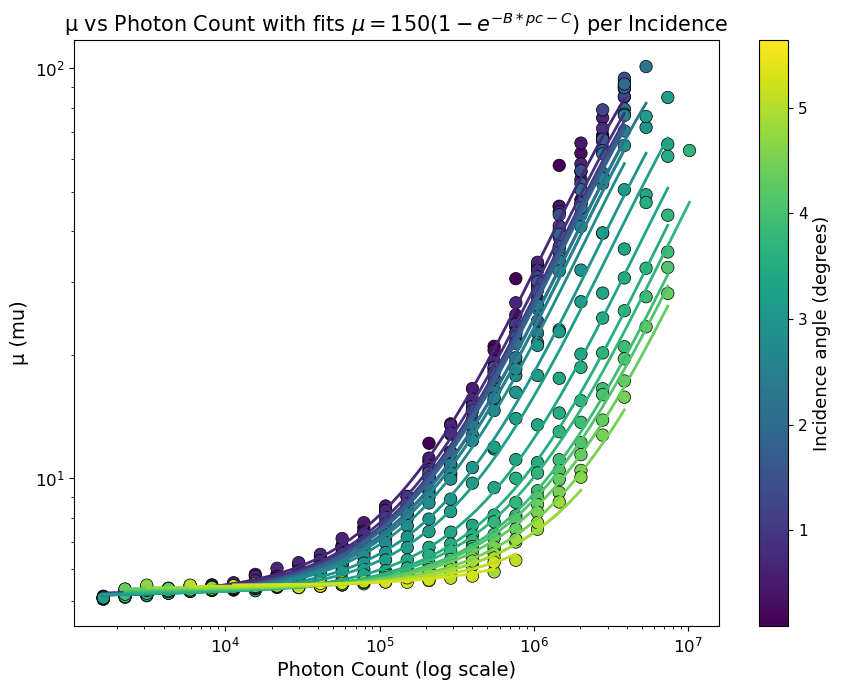

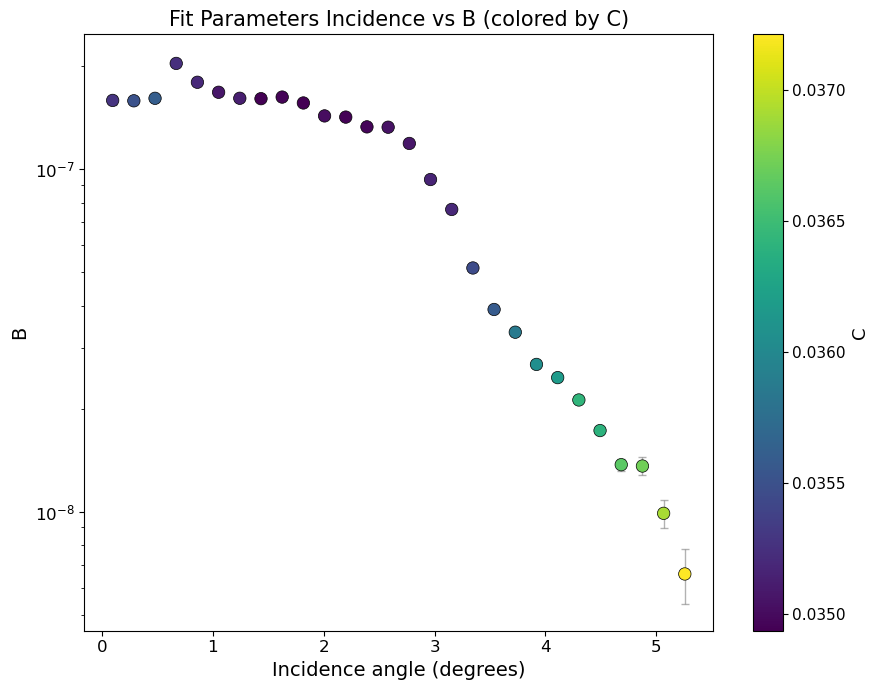

In [14]:
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

def saturating_exp(pc, B, C):
    return 150 * (1 - np.exp(-B*(pc)-C)) 
    #return 5.25*np.exp(B*pc+C)
unique_incs = np.unique(inc_flat)

B_fit_list = []
C_fit_list = []
B_err_list = []
C_err_list = []
inc_list = []
chi2red_list = []

fig, ax = plt.subplots(figsize=(9, 7))

sc = ax.scatter(pc_flat, mu_flat, c=inc_flat, cmap='viridis', s=80,
                 edgecolor='k', linewidth=0.5, zorder=2)

cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=inc_flat.min(), vmax=inc_flat.max())

for inc_val in unique_incs:
    mask = inc_flat == inc_val
    pc_i = pc_flat[mask]
    mu_i = mu_flat[mask]
    mu_err_i = mu_err_flat[mask] if 'mu_err_flat' in dir() else None

    if len(pc_i) < 3:
        continue

    order = np.argsort(pc_i)
    pc_i_sorted = pc_i[order]
    mu_i_sorted = mu_i[order]
    mu_err_i_sorted = mu_err_i[order] if mu_err_i is not None else None

    if mu_err_i_sorted is not None:
        nonzero_err = mu_err_i_sorted[mu_err_i_sorted > 0]
        floor_val = np.nanmedian(nonzero_err) if len(nonzero_err) > 0 else 1.0
        sigma_safe = np.where(mu_err_i_sorted > 0, mu_err_i_sorted, floor_val)
    else:
        sigma_safe = None

    try:
        p0 = [1.0 / np.median(pc_i_sorted), 0.0]
        # Bounds: B, C
        bounds = ([0, 0], [1, 1])
        popt, pcov = curve_fit(saturating_exp, pc_i_sorted, mu_i_sorted,
                                p0=p0, sigma=sigma_safe,
                                absolute_sigma=(sigma_safe is not None),
                                bounds=bounds, maxfev=100000)
        B_fit, C_fit = popt
        B_err, C_err = np.sqrt(np.diag(pcov))

        mu_pred = saturating_exp(pc_i_sorted, B_fit, C_fit)
        if sigma_safe is not None:
            chi2 = np.sum(((mu_i_sorted - mu_pred) / sigma_safe) ** 2)
        else:
            chi2 = np.sum((mu_i_sorted - mu_pred) ** 2)
        dof = len(pc_i_sorted) - 2
        chi2_red = chi2 / dof if dof > 0 else np.nan

        B_fit_list.append(B_fit)
        C_fit_list.append(C_fit)
        B_err_list.append(B_err)
        C_err_list.append(C_err)
        inc_list.append(inc_val)
        chi2red_list.append(chi2_red)

        pc_smooth = np.logspace(np.log10(pc_i_sorted.min()), np.log10(pc_i_sorted.max()), 100)
        mu_smooth = saturating_exp(pc_smooth, B_fit, C_fit)
        color = cmap(norm(inc_val))
        ax.plot(pc_smooth, mu_smooth, '-', color=color, linewidth=2, zorder=3)

        print(f"Incidence={inc_val:.3f}: "
              f"B={B_fit:.1e}±{B_err:.1e}, C={C_fit:.1e}±{C_err:.1e}, chi2_red={chi2_red:.4f}")

    except Exception as e:
        print(f"Fit failed for incidence={inc_val:.3f}: {e}")
        continue

B_fit_arr = np.array(B_fit_list)
C_fit_arr = np.array(C_fit_list)
B_err_arr = np.array(B_err_list)
C_err_arr = np.array(C_err_list)
inc_arr = np.array(inc_list)
chi2red_arr = np.array(chi2red_list)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Photon Count (log scale)", fontsize=14)
ax.set_ylabel("μ (mu)", fontsize=14)
ax.set_title(r"μ vs Photon Count with fits $\mu = 150(1-e^{-B*pc-C})$ per Incidence", fontsize=15)
ax.tick_params(axis='both', labelsize=12)

cbar = fig.colorbar(sc, ax=ax)
cbar.set_label("Incidence angle (degrees)", fontsize=13)
cbar.ax.tick_params(labelsize=11)

plt.tight_layout()
plt.savefig("mu_vs_pc_saturating_fits.png", dpi=150)
plt.show()

# --- Plot Incidence vs B, colored by C, with error bars ---
fig2, ax2 = plt.subplots(figsize=(9, 7))

ax2.errorbar(inc_arr, B_fit_arr, yerr=B_err_arr,
             fmt='none', ecolor='gray', elinewidth=1, capsize=3, alpha=0.6, zorder=2)

sc2 = ax2.scatter(inc_arr, B_fit_arr, c=C_fit_arr, cmap='viridis', s=80,
                   edgecolor='k', linewidth=0.5, zorder=3)

ax2.set_xlabel("Incidence angle (degrees)", fontsize=14)
ax2.set_ylabel("B", fontsize=14)
ax2.set_title("Fit Parameters Incidence vs B (colored by C)", fontsize=15)
ax2.tick_params(axis='both', labelsize=12)

cbar2 = fig2.colorbar(sc2, ax=ax2)
cbar2.set_label("C", fontsize=13)
cbar2.ax.tick_params(labelsize=11)
ax2.set_yscale('log')
plt.tight_layout()
plt.savefig("C_vs_B_by_incidence.png", dpi=150)
plt.show()

In [2]:
# ── Cell 1: 2D scan over (photon bins × angle bins) → total efficiency heatmap ──
import numpy as np
import matplotlib.pyplot as plt

PHOTON_BIN_LIST = [4, 5, 6, 8, 10, 12, 15, 20, 25, 30, 40, 50, 60, 80, 100]
ANGLE_BIN_LIST  = [4, 5, 6, 8, 10, 12, 15, 20, 25, 30, 40, 50, 60, 80, 100]
PE_THRESH       = 20
X_LO, X_HI      = np.log10(30.0), np.log10(3e6)   # fixed photon domain
MIN_CELL        = 20                               # min events per (photon,angle) cell

ang = incidence_angle(df["zen"].to_numpy(), df["az"].to_numpy())
pho = df["cph_photon_count"].to_numpy(dtype=float)
trg = (df["max_pe"].to_numpy() >= PE_THRESH).astype(float)

m_ang, m_pho, m_pos, m_R = np.isfinite(ang), np.isfinite(pho), pho > 0, (R == 0)
good = m_ang & m_pho & m_pos & m_R
print(f"COMBINED cut keeps {good.sum():>9d}  ({good.mean()*100:5.1f}%)")

ang, pho, trg = ang[good], pho[good], trg[good]
x = np.log10(pho)

in_dom = (x >= X_LO) & (x <= X_HI)
print(f"events inside fixed domain: {in_dom.sum():>9d}  ({in_dom.mean()*100:5.1f}%)")
ang, x, trg = ang[in_dom], x[in_dom], trg[in_dom]

ref_evtw = trg.mean()
print(f"reference: pure event-weighted efficiency = {ref_evtw:.6f}")
# ── Cell 2: run the 2D scan (vectorized with np.bincount) ──
# Convention: event-weighted in BOTH photon and angle. For each (nb_pho, nb_ang)
# combo, we bin events on a 2D grid using a single flat-index bincount instead
# of looping over every cell in Python — this turns an O(n_p * n_a * nb_pho *
# nb_ang) Python loop into O(n_p * n_a) numpy calls, each O(N_events).

n_p, n_a = len(PHOTON_BIN_LIST), len(ANGLE_BIN_LIST)
TOT      = np.full((n_a, n_p), np.nan)
NVALID   = np.zeros((n_a, n_p), dtype=int)
NSPARSE  = np.zeros((n_a, n_p), dtype=int)

N = x.size

for ip, nb_pho in enumerate(PHOTON_BIN_LIST):
    p_edges = np.linspace(X_LO, X_HI, nb_pho + 1)
    p_idx   = np.clip(np.digitize(x, p_edges[1:-1]), 0, nb_pho - 1)

    for ia, nb_ang in enumerate(ANGLE_BIN_LIST):
        a_edges = np.unique(np.quantile(ang, np.linspace(0, 1, nb_ang + 1)))
        n_apan  = len(a_edges) - 1
        a_idx   = np.clip(np.digitize(ang, a_edges[1:-1]), 0, n_apan - 1)

        # flatten (photon_bin, angle_bin) -> single integer index
        flat_idx  = p_idx * n_apan + a_idx
        n_cells   = nb_pho * n_apan

        counts    = np.bincount(flat_idx, minlength=n_cells)
        trg_sums  = np.bincount(flat_idx, weights=trg, minlength=n_cells)

        valid_mask  = counts >= MIN_CELL
        sparse_mask = (counts > 0) & ~valid_mask

        w_sum = counts[valid_mask].sum()
        e_sum = trg_sums[valid_mask].sum()   # sum of counts*eff = sum of trg in valid cells

        TOT[ia, ip]     = e_sum / w_sum if w_sum > 0 else np.nan
        NVALID[ia, ip]  = valid_mask.sum()
        NSPARSE[ia, ip] = sparse_mask.sum()

print("scan complete")
print(f"TOT range: {np.nanmin(TOT):.6f} to {np.nanmax(TOT):.6f}")
print(f"reference: {ref_evtw:.6f}")

COMBINED cut keeps   2116635  ( 49.5%)
events inside fixed domain:   2034324  ( 96.1%)
reference: pure event-weighted efficiency = 0.007815
scan complete
TOT range: 0.005449 to 0.007819
reference: 0.007815


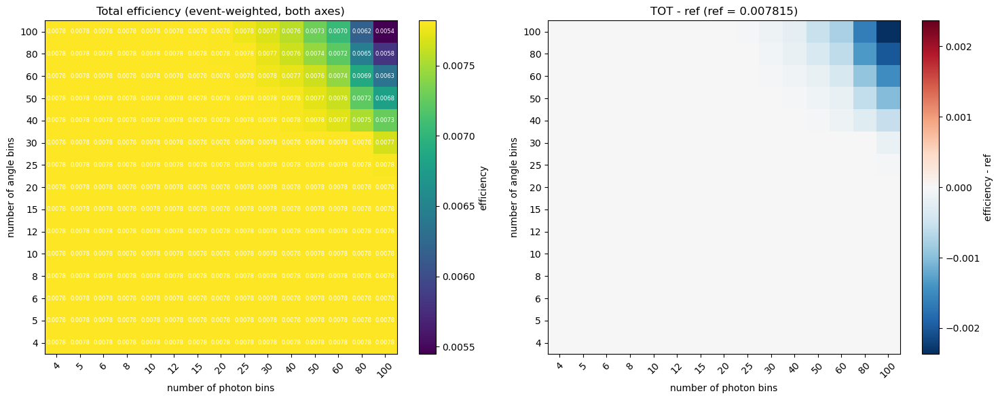

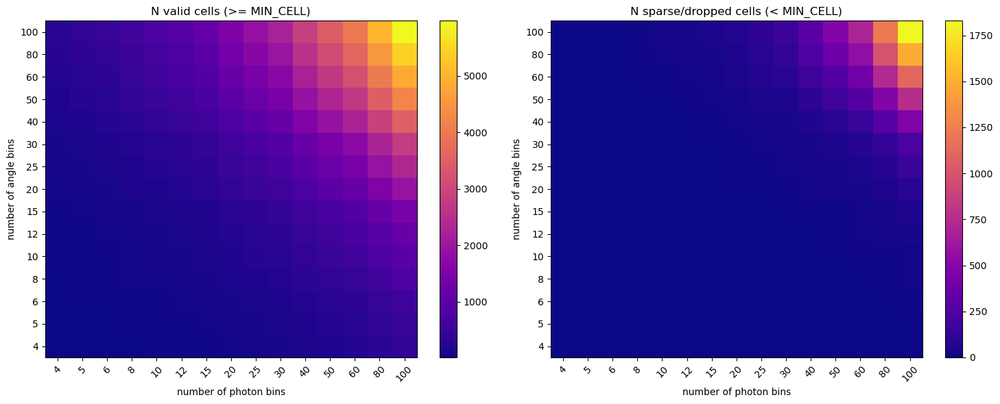


Rows = angle bins, cols = photon bins
TOT matrix:
[[0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00781 0.00781 0.00781 0.00781 0.00781]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00781 0.00781 0.00781 0.00781 0.00781]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00781 0.00781 0.00781 0.00781 0.00782]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00781 0.00781 0.00782 0.00782 0.00782]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00781 0.00782 0.00782 0.00782 0.00782]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781
  0.00781 0.00782 0.00782 0.00782 0.00782 0.00782]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00782
  0.00782 0.00782 0.00782 0.00782 0.00782 0.00782]
 [0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00781 0.00782 0.00782


In [3]:
# ── Cell 3: heatmap of total efficiency ──
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

im0 = ax[0].imshow(TOT, origin="lower", aspect="auto", cmap="viridis")
ax[0].set_xticks(range(n_p)); ax[0].set_xticklabels(PHOTON_BIN_LIST, rotation=45)
ax[0].set_yticks(range(n_a)); ax[0].set_yticklabels(ANGLE_BIN_LIST)
ax[0].set_xlabel("number of photon bins")
ax[0].set_ylabel("number of angle bins")
ax[0].set_title("Total efficiency (event-weighted, both axes)")
cb0 = fig.colorbar(im0, ax=ax[0]); cb0.set_label("efficiency")

# annotate cells with values
for ia in range(n_a):
    for ip in range(n_p):
        if np.isfinite(TOT[ia, ip]):
            ax[0].text(ip, ia, f"{TOT[ia, ip]:.4f}", ha="center", va="center",
                       fontsize=6, color="white")

# deviation from reference, useful to see where it stabilizes
DIFF = TOT - ref_evtw
im1 = ax[1].imshow(DIFF, origin="lower", aspect="auto", cmap="RdBu_r",
                    vmin=-np.nanmax(np.abs(DIFF)), vmax=np.nanmax(np.abs(DIFF)))
ax[1].set_xticks(range(n_p)); ax[1].set_xticklabels(PHOTON_BIN_LIST, rotation=45)
ax[1].set_yticks(range(n_a)); ax[1].set_yticklabels(ANGLE_BIN_LIST)
ax[1].set_xlabel("number of photon bins")
ax[1].set_ylabel("number of angle bins")
ax[1].set_title(f"TOT - ref (ref = {ref_evtw:.6f})")
cb1 = fig.colorbar(im1, ax=ax[1]); cb1.set_label("efficiency - ref")

plt.tight_layout()
plt.show()
# ── Cell 4: sparsity diagnostic (helps judge which corners of the grid to trust) ──
fig, ax = plt.subplots(1, 2, figsize=(15, 6))

im0 = ax[0].imshow(NVALID, origin="lower", aspect="auto", cmap="plasma")
ax[0].set_xticks(range(n_p)); ax[0].set_xticklabels(PHOTON_BIN_LIST, rotation=45)
ax[0].set_yticks(range(n_a)); ax[0].set_yticklabels(ANGLE_BIN_LIST)
ax[0].set_xlabel("number of photon bins"); ax[0].set_ylabel("number of angle bins")
ax[0].set_title("N valid cells (>= MIN_CELL)")
fig.colorbar(im0, ax=ax[0])

im1 = ax[1].imshow(NSPARSE, origin="lower", aspect="auto", cmap="plasma")
ax[1].set_xticks(range(n_p)); ax[1].set_xticklabels(PHOTON_BIN_LIST, rotation=45)
ax[1].set_yticks(range(n_a)); ax[1].set_yticklabels(ANGLE_BIN_LIST)
ax[1].set_xlabel("number of photon bins"); ax[1].set_ylabel("number of angle bins")
ax[1].set_title("N sparse/dropped cells (< MIN_CELL)")
fig.colorbar(im1, ax=ax[1])

plt.tight_layout()
plt.show()

print("\nRows = angle bins, cols = photon bins")
print("TOT matrix:")
print(np.round(TOT, 5))

In [13]:
i_ang = ANGLE_BIN_LIST.index(30)
i_pho = PHOTON_BIN_LIST.index(60)
print(f"TOT     = {TOT[i_ang, i_pho]:.6f}  (ref = {ref_evtw:.6f})")
print(f"NVALID  = {NVALID[i_ang, i_pho]}")
print(f"NSPARSE = {NSPARSE[i_ang, i_pho]}")
print(f"total cells = {30*50}, sparse fraction = {NSPARSE[i_ang, i_pho]/(30*50):.3f}")

TOT     = 0.007817  (ref = 0.007815)
NVALID  = 1726
NSPARSE = 74
total cells = 1500, sparse fraction = 0.049


In [2]:
#Optic Simulation
import numpy as np

def simulate_davies_cotton_optics(X_photon, Y_photon, cos_x, cos_y, R=150, r_cam=4.96,
                                   get_mirror_photons=False, plotting=False):
    # 1) compute z on the spherical dish, keep only real hits
    r2 = X_photon**2 + Y_photon**2
    ok = (r2 <= R*R)
    X = X_photon[ok]
    Y = Y_photon[ok]
    Z = np.sqrt(R*R - r2[ok])

    # 2) incident unit vectors
    cos_z = np.sqrt(1.0 - cos_x[ok]**2 - cos_y[ok]**2)
    v_i = np.vstack((cos_x[ok], cos_y[ok], -cos_z)).T  # (M,3)

    # 3) normals at each hit (Davies-Cotton: radius of curvature 2R)
    R_norm = R * 2
    Z2 = np.sqrt(R_norm**2 - r2[ok])
    n = np.vstack((-X, -Y, R_norm - (-Z2 + R_norm))).T
    n = n / R_norm

    # 4) reflected vectors
    dot_in = np.sum(v_i * n, axis=1)
    v_r = v_i - 2 * dot_in[:, None] * n

    # 5) intersect with camera plane z=0
    t = Z / v_r[:, 2]
    t_back = -Z / v_i[:, 2]

    good = (t > 0) & (t_back > 0)
    cos_z = cos_z[good]
    t = t[good]
    X_hit = X[good]
    Y_hit = Y[good]
    v_rx = v_r[good, 0]
    v_ry = v_r[good, 1]

    n_z = np.vstack((0, 0, -1)).T
    incident_angles = np.arccos(np.sum(-v_r[good] * n_z, axis=1))

    t_back = t_back[good]
    X_back = X[good]
    Y_back = Y[good]
    v_bx = v_i[good, 0]
    v_by = v_i[good, 1]

    # image coords
    x_img = X_hit + t * v_rx
    y_img = Y_hit + t * v_ry
    x_img_back = X_back - t_back * v_bx
    y_img_back = Y_back - t_back * v_by

    # 6) select those within camera radius
    inside = (np.abs(x_img) <= r_cam) & (np.abs(y_img) <= r_cam)
    x_img = x_img[inside]
    y_img = y_img[inside]
    cos_z = cos_z[inside]
    incident_angles = incident_angles[inside]
    y_img_back = y_img_back[inside]
    x_img_back = x_img_back[inside]
    X_hit_inside = X_hit[inside]
    Y_hit_inside = Y_hit[inside]

    # 6.2) back-projection of incident photons must fall outside camera
    outside = (np.abs(x_img_back) > r_cam) | (np.abs(y_img_back) > r_cam)
    x_img = x_img[outside]
    y_img = y_img[outside]
    cos_z = cos_z[outside]
    incident_angles = incident_angles[outside]
    X_hit_final = X_hit_inside[outside]
    Y_hit_final = Y_hit_inside[outside]

    cos_x_final = cos_x[ok][good][inside][outside]
    cos_y_final = cos_y[ok][good][inside][outside]
    
    R_mask = np.sqrt(r2[ok][good][inside][outside])
    if get_mirror_photons:
        return X_hit_final, Y_hit_final, incident_angles, cos_x_final, cos_y_final
    else:
        return x_img, y_img, incident_angles, cos_x_final, cos_y_final, R_mask

import numpy as np

import numpy as np

def generate_light_cone(n_photons=100000, opening_angle_deg=1.3,
                         area_radius=150, r_min_frac=1e-3,
                         radial_dist="uniform",
                         axis_theta_deg=0.0, axis_phi_deg=0.0,
                         seed=None):
    """
    Generate a cone of light rays with a given opening angle,
    illuminating a circular area, for input into simulate_davies_cotton_optics.

    Parameters
    ----------
    n_photons : int
        Number of photons to generate.
    opening_angle_deg : float
        Half-opening angle of the light cone, in degrees.
    area_radius : float
        Radius of the circular area (e.g. mirror dish radius R).
    r_min_frac : float
        Fraction of area_radius used as the minimum radius cutoff,
        only used when radial_dist="1/r" (to avoid singularity at r=0).
    radial_dist : str
        "uniform" for uniform area sampling (r ∝ sqrt(u)),
        "1/r" for a 1/r radial probability distribution (log-uniform in r).
    axis_theta_deg : float
        Zenith angle of the cone's central axis, in degrees (0 = straight down, -z).
    axis_phi_deg : float
        Azimuthal angle of the cone's central axis, in degrees.
    seed : int or None
        Random seed for reproducibility.

    Returns
    -------
    X_photon, Y_photon : ndarray
        Photon impact positions on the mirror plane.
    cos_x, cos_y : ndarray
        Direction cosines (x,y components) of each photon's direction vector.
    """
    rng = np.random.default_rng(seed)

    # --- 1) Sample photon radial positions ---
    if radial_dist == "uniform":
        r = area_radius * np.sqrt(rng.uniform(0, 1, n_photons))
    elif radial_dist == "1/r":
        r_min = r_min_frac * area_radius
        u = rng.uniform(0, 1, n_photons)
        r = r_min * (area_radius / r_min) ** u
    else:
        raise ValueError("radial_dist must be 'uniform' or '1/r'")

    phi_pos = rng.uniform(0, 2 * np.pi, n_photons)
    X_photon = r * np.cos(phi_pos)
    Y_photon = r * np.sin(phi_pos)

    # --- 2) Sample directions within the opening angle of the cone ---
    opening_angle_rad = np.radians(opening_angle_deg)
    cos_theta_min = np.cos(opening_angle_rad)
    cos_theta = np.ones(n_photons)* cos_theta_min##rng.uniform(cos_theta_min, 1, n_photons) #
    sin_theta = np.sqrt(1.0 - cos_theta**2)
    phi_dir = rng.uniform(0, 2 * np.pi, n_photons)

    dx_local = sin_theta * np.cos(phi_dir)
    dy_local = sin_theta * np.sin(phi_dir)
    dz_local = cos_theta

    # --- 3) Rotate cone-local direction to the desired axis orientation ---
    theta_axis = np.radians(axis_theta_deg)
    phi_axis = np.radians(axis_phi_deg)

    dx_tilt = dx_local * np.cos(theta_axis) + dz_local * np.sin(theta_axis)
    dy_tilt = dy_local
    dz_tilt = -dx_local * np.sin(theta_axis) + dz_local * np.cos(theta_axis)

    dx_final = dx_tilt * np.cos(phi_axis) - dy_tilt * np.sin(phi_axis)
    dy_final = dx_tilt * np.sin(phi_axis) + dy_tilt * np.cos(phi_axis)

    cos_x = dx_final
    cos_y = dy_final

    return X_photon, Y_photon, cos_x, cos_y



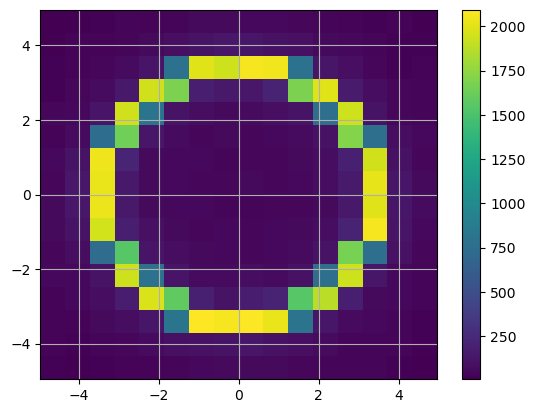

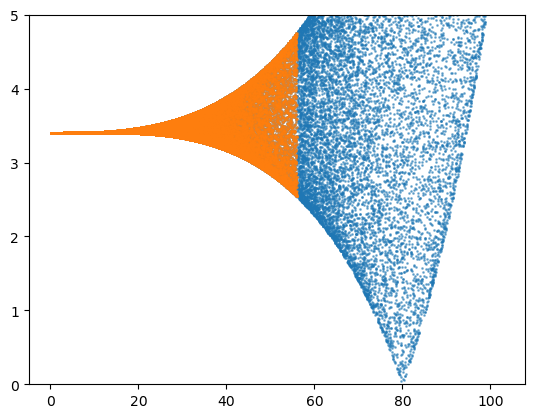

In [3]:
X_photon, Y_photon, cos_x, cos_y = generate_light_cone(
        n_photons=200000,
        opening_angle_deg=1.3,
        area_radius=150,
        radial_dist="1/r",
        r_min_frac=1e-3,axis_theta_deg=0, axis_phi_deg=0.0,
        seed=42,
    )
x_img, y_img, incident_angles, cos_x_final, cos_y_final, R_mask = simulate_davies_cotton_optics(X_photon, Y_photon, cos_x, cos_y, R=150, r_cam=4.96,
                                   get_mirror_photons=False)
import matplotlib.pyplot as plt

plt.hist2d(y_img, x_img, bins = 16)
plt.colorbar()
plt.grid()
plt.show()
import numpy as np

import numpy as np

def analytical_optics(X, Y, cos_x, cos_y, R=150):
    """
    Analytical closed-form mapping (matches simulate_davies_cotton_optics exactly,
    before camera-radius / back-projection masking):
    mirror hit position + incident direction -> camera image position
    and incidence angle, for a Davies-Cotton mirror.
    """
    r2 = X**2 + Y**2
    Z = np.sqrt(R**2 - r2)
    cos_z = np.sqrt(1.0 - cos_x**2 - cos_y**2)

    R_n = 2 * R
    Z2 = np.sqrt(R_n**2 - r2)
    d = (-X * cos_x - Y * cos_y - cos_z * Z2) / R_n

    v_rx = cos_x + d * X / R
    v_ry = cos_y + d * Y / R
    v_rz = -cos_z - d * Z2 / R

    incident_angle = np.arccos(v_rz)   # corrected sign

    t = Z / v_rz                        # corrected sign
    x_img = X + t * v_rx
    y_img = Y + t * v_ry

    return x_img, y_img, incident_angle, v_rx, v_ry, v_rz
r_img = np.sqrt(x_img**2 + y_img**2)
R_photon =np.sqrt(X_photon**2+Y_photon**2)
Theta_rad = np.arccos(np.sqrt(1-cos_x_final**2-cos_y_final**2))
x, y, incident_angle, v_rx, v_ry, v_rz = analytical_optics(X_photon, Y_photon, cos_x, cos_y, R=150)
r_img_analytical = np.sqrt(x**2+y**2)
plt.scatter(R_mask, r_img, alpha = 0.5, s = 1)
mask = (r_img_analytical <= 5)&(R_photon<=56)
plt.scatter(R_photon[mask], r_img_analytical[mask], alpha = 0.5, s =1 )
plt.ylim(0, 5)
plt.show()
Z_photon = np.sqrt(150**2 - R_photon[mask]**2)


In [19]:
def analytical_DC_optics(X, Y, cos_x, cos_y, R=150): 
    """
    Analytical closed-form mapping (matches simulate_davies_cotton_optics exactly,
    before camera-radius / back-projection masking):
    mirror hit position + incident direction -> camera image position
    and incidence angle, for a Davies-Cotton mirror.
    """
    r2 = X**2 + Y**2
    Z = np.sqrt(R**2 - r2)
    cos_z = np.sqrt(1.0 - cos_x**2 - cos_y**2)

    R_n = 2 * R
    Z2 = np.sqrt(R_n**2 - r2)

    d = (-X * cos_x - Y * cos_y - cos_z * Z2) / R_n

    v_rx = cos_x + d * X / R
    v_ry = cos_y + d * Y / R
    v_rz = -cos_z - d * Z2 / R


    t = Z / v_rz                        # corrected sign
    x_img = X + t * v_rx
    y_img = Y + t * v_ry

    return x_img, y_img, v_rx, v_ry, v_rz

In [39]:
# Spherical parametrization symbols

import sympy as sp

r, alpha, theta, phi, R, x = sp.symbols('r alpha theta phi R x', real=True, positive=True)

# Mirror hit position (X, Y) in polar form:
#   r     = radial distance from mirror center axis (0 <= r <= R)
#   alpha = azimuthal angle of the hit position on the mirror
X_s = r * sp.cos(alpha)
Y_s = r * sp.sin(alpha)

# Incident direction (cos_x, cos_y) in spherical form:
#   theta = polar (zenith) angle of incoming direction w.r.t. optical axis
#   phi   = azimuthal angle of incoming direction
cos_x_s = sp.sin(theta) * sp.cos(phi)
cos_y_s = sp.sin(theta) * sp.sin(phi)
# (cos_z = cos(theta) automatically, since cos_x^2+cos_y^2+cos_z^2=1)

def analytical_DC_optics_spherical(r, alpha, theta, phi):
    """
    Spherical-coordinate version of analytical_DC_optics.
    Mirror position given by (r, alpha) polar coords on mirror surface.
    Incident direction given by (theta, phi) spherical angles.
    """
    X = r * sp.cos(alpha)
    Y = r * sp.sin(alpha)
    cos_x = sp.sin(theta) * sp.cos(phi)
    cos_y = sp.sin(theta) * sp.sin(phi)

    r2 = X**2 + Y**2
    Z = sp.sqrt(R**2 - r2)
    cos_z = sp.cos(theta)   # since cos_x^2+cos_y^2+cos_z^2 = 1 automatically

    R_n = 2 * R
    Z2 = sp.sqrt(R_n**2 - r2)

    d = (-X * cos_x - Y * cos_y - cos_z * Z2) / R_n

    v_rx = cos_x + d * X / R
    v_ry = cos_y + d * Y / R
    v_rz = -cos_z - d * Z2 / R

    t = Z / v_rz
    x_img = X + t * v_rx
    y_img = Y + t * v_ry
    x_img = sp.simplify(x_img)
    y_img = sp.simplify(y_img)
    return x_img, y_img, v_rx, v_ry, v_rz


x_img, y_img, v_rx, v_ry, v_rz = analytical_DC_optics_spherical(r, alpha, theta, phi)

r_img2 = x_img**2 + y_img**2
r_img2 = sp.simplify(r_img2)
# Take the derivative with respect to r
dr2_img_dr = sp.diff(r_img2, r)

# Optionally simplify the result
#dr2_img_dr_simplified = sp.simplify(dr2_img_dr)

I_expr = 2*dr2_img_dr**(-1)

I_expr_x = I_expr.subs(r, x*R)

I_func = sp.lambdify((r, alpha, theta, phi, R), I_expr, modules='numpy', cse=True)
x_func = sp.lambdify((r, alpha, theta, phi, R), x_img, modules='numpy', cse=True)
y_func = sp.lambdify((r, alpha, theta, phi, R), y_img, modules='numpy', cse=True)

/tmp/ipykernel_2131894/2098688546.py:65: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



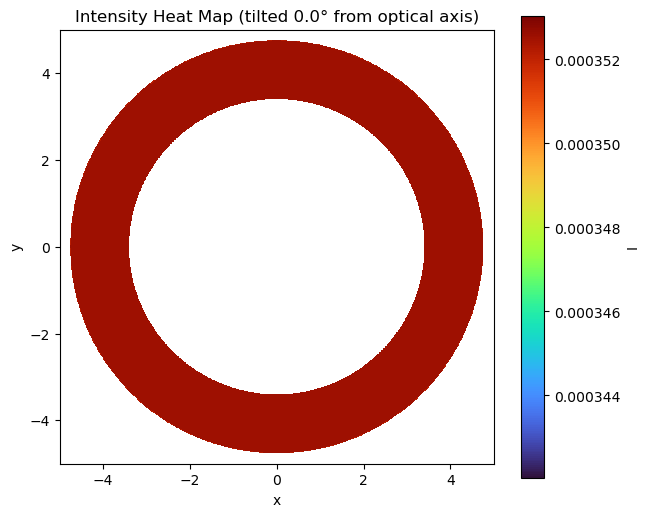

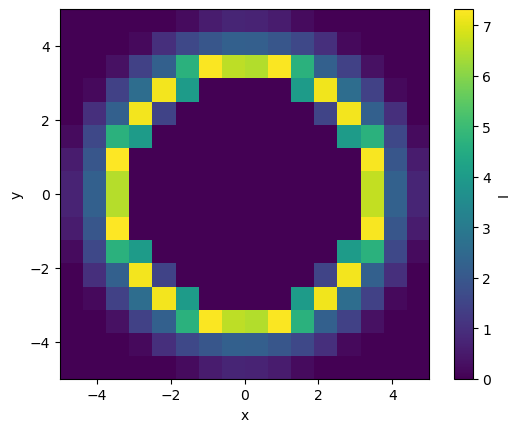

In [40]:
# Intensity vs muon incidence angle:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

n_r, n_alpha = 1000, 1000
r_vals = np.linspace(0, 56, n_r)
alpha_vals = np.linspace(0, 2*np.pi, n_alpha)
r_grid, alpha_grid = np.meshgrid(r_vals, alpha_vals)
dr = r_vals[1] - r_vals[0]
dalpha = alpha_vals[1] - alpha_vals[0]

cone_angle = np.radians(1.3)
tilt_angle = np.radians(0)
tilt_phi = 0.0
R_val = 150

# --- Step 1: cone direction vectors in cone's own frame ---
sin_cone = np.sin(cone_angle)
cos_cone = np.cos(cone_angle)
cx_p = sin_cone * np.cos(alpha_grid)
cy_p = sin_cone * np.sin(alpha_grid)
cz_p = cos_cone  # scalar, broadcasts fine

# --- Step 2: single combined rotation matrix (about z by tilt_phi, y by tilt_angle, z by -tilt_phi) ---
ct, st = np.cos(tilt_angle), np.sin(tilt_angle)
cp, sp = np.cos(tilt_phi), np.sin(tilt_phi)

# Precomputed combined rotation matrix elements (derived analytically once)
# R = Rz(tilt_phi) @ Ry(tilt_angle) @ Rz(-tilt_phi)
R00 = cp*cp*ct + sp*sp
R01 = cp*sp*(ct - 1)
R02 = cp*st
R10 = cp*sp*(ct - 1)
R11 = sp*sp*ct + cp*cp
R12 = sp*st
R20 = -cp*st
R21 = -sp*st
R22 = ct

cx_lab = R00*cx_p + R01*cy_p + R02*cz_p
cy_lab = R10*cx_p + R11*cy_p + R12*cz_p
cz_lab = R20*cx_p + R21*cy_p + R22*cz_p

# --- Step 3: convert to theta, phi ---
theta_grid = np.arccos(cz_lab)
phi_grid = np.arctan2(cy_lab, cx_lab)

# --- Image plane mapping ---
X_img_grid = x_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
Y_img_grid = y_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
R_img_grid = np.hypot(X_img_grid, Y_img_grid)

dR_img_dr = np.gradient(R_img_grid, dr, axis=1)
dr_img = dR_img_dr * dr

I_grid = np.abs(
    I_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
    * R_img_grid * dalpha * dr_img
)
I_grid[I_grid <= 0] = np.nan

# --- Plot 1: raw scattered intensity map ---
plt.figure(figsize=(7, 6))
plt.pcolormesh(X_img_grid, Y_img_grid, I_grid, shading='auto', cmap='turbo')
plt.colorbar(label='I')
plt.xlabel('x'); plt.ylabel('y')
plt.xlim(-5, 5); plt.ylim(-5, 5)
plt.title(f'Intensity Heat Map (tilted {np.degrees(tilt_angle)}° from optical axis)')
plt.gca().set_aspect('equal')
plt.show()

# --- Plot 2: rebinned onto fixed camera grid ---
n_bins = 16
x_edges = np.linspace(-5, 5, n_bins + 1)
y_edges = np.linspace(-5, 5, n_bins + 1)

mask = np.isfinite(X_img_grid) & np.isfinite(Y_img_grid) & np.isfinite(I_grid)
H, _, _ = np.histogram2d(
    X_img_grid[mask], Y_img_grid[mask],
    bins=[x_edges, y_edges],
    weights=I_grid[mask]
)

plt.imshow(H.T, origin='lower', extent=[-5, 5, -5, 5])
plt.colorbar(label='I')
plt.xlabel('x'); plt.ylabel('y')
plt.show()

In [41]:
# Intensity vs muon incidence angle:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook"

n_r, n_alpha = 100, 100
r_vals = np.linspace(0, 56, n_r)
alpha_vals = np.linspace(0, 2*np.pi, n_alpha)
dr = r_vals[1] - r_vals[0]
dalpha = alpha_vals[1] - alpha_vals[0]
r_grid, alpha_grid = np.meshgrid(r_vals, alpha_vals)

cone_angle = np.radians(1.3)
tilt_phi = 0.0
R_val = 150

sin_cone = np.sin(cone_angle)
cos_cone = np.cos(cone_angle)
cx_p = sin_cone * np.cos(alpha_grid)
cy_p = sin_cone * np.sin(alpha_grid)
cz_p = cos_cone  # scalar broadcasts

# tilt_phi is constant across the whole loop -> precompute its cos/sin once
cp, sp = np.cos(tilt_phi), np.sin(tilt_phi)

tilt_angles_deg = np.linspace(0, 3, 31)

n_bins = 16
x_edges = np.linspace(-5, 5, n_bins + 1)
y_edges = np.linspace(-5, 5, n_bins + 1)
x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])

frames = []
for tilt_deg in tilt_angles_deg:
    tilt_angle = np.radians(tilt_deg)
    ct, st = np.cos(tilt_angle), np.sin(tilt_angle)

    # Combined rotation matrix R = Rz(tilt_phi) @ Ry(tilt_angle) @ Rz(-tilt_phi)
    R00 = cp*cp*ct + sp*sp
    R01 = cp*sp*(ct - 1)
    R02 = cp*st
    R10 = cp*sp*(ct - 1)
    R11 = sp*sp*ct + cp*cp
    R12 = sp*st
    R20 = -cp*st
    R21 = -sp*st
    R22 = ct

    cx_lab = R00*cx_p + R01*cy_p + R02*cz_p
    cy_lab = R10*cx_p + R11*cy_p + R12*cz_p
    cz_lab = R20*cx_p + R21*cy_p + R22*cz_p

    theta_grid = np.arccos(cz_lab)
    phi_grid = np.arctan2(cy_lab, cx_lab)

    X_img_grid = x_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
    Y_img_grid = y_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
    R_img_grid = np.hypot(X_img_grid, Y_img_grid)

    dR_img_dr = np.gradient(R_img_grid, dr, axis=1)
    dr_img = dR_img_dr * dr

    I_grid = np.abs(
        I_func(r_grid, alpha_grid, theta_grid, phi_grid, R_val)
        * R_img_grid * dalpha * dr_img
    )

    mask = np.isfinite(X_img_grid) & np.isfinite(Y_img_grid) & np.isfinite(I_grid)

    H, _, _ = np.histogram2d(
        X_img_grid[mask], Y_img_grid[mask],
        bins=[x_edges, y_edges],
        weights=I_grid[mask]
    )
    H = H.T

    frames.append(go.Frame(
        data=[go.Heatmap(z=H, x=x_centers, y=y_centers, colorscale='Turbo',
                          colorbar=dict(title='Sum Intensity'))],
        name=f"{tilt_deg:.2f}"
    ))

fig = go.Figure(
    data=frames[0].data,
    frames=frames
)

fig.update_layout(
    title="Binned Intensity Heat Map vs Tilt Angle (16x16 bins)",
    xaxis_title="x",
    yaxis_title="y",
    xaxis=dict(range=[-5, 5], scaleanchor="y"),
    yaxis=dict(range=[-5, 5]),
    width=650,
    height=650,
    sliders=[{
        "steps": [
            {
                "args": [[f.name], {"frame": {"duration": 0, "redraw": True},
                                     "mode": "immediate"}],
                "label": f.name,
                "method": "animate"
            } for f in frames
        ],
        "currentvalue": {"prefix": "Tilt angle (deg): "}
    }],
    updatemenus=[{
        "type": "buttons",
        "buttons": [{
            "label": "Play",
            "method": "animate",
            "args": [None, {"frame": {"duration": 200, "redraw": True},
                             "fromcurrent": True}]
        }]
    }]
)

fig.show()

In [ ]:
#Collect data:
import glob
import os
import re
import sys
sys.path.append('/uufs/chpc.utah.edu/common/home/u1520754/Muon_Trinity/analysis/')

import numpy as np
import pandas as pd
import pickle

from ReadTrinity import read_cherenkov_hits

# ── Config ─────────────────────────────────────────────────────────────────────
Zen_max = 90.0
Zen_min = 89.9
Az_max = 270.0
Az_min = 270.0

PE_THRESHOLD = 20
DELTA_PE = 200
BASE_DIR = "/scratch/general/vast/u1520754/muon_sim_chain_tree"

ENERGY_MIN_GEV = 1e2
ENERGY_MAX_GEV = 1e6

ZEN_FILTER = None
AZ_FILTER = None
HEIGHT_FILTER = None
TEL_X_FILTER = None
TEL_Z_FILTER = None
SEED_FILTER = None

particle_id = 13
radius = 5
y = 0

# ── File reader ─────────────────────────────────────────────────────────────────
def read_specific_cherenkov_hits(pid, E_str, zen, az, h, x, y, z, r, seed):
    try:
        input_file = (f"/scratch/general/vast/u1520754/muon_sim_chain_tree/"
                    f"Muon_pid{pid}_E{E_str}_R{r}/pdg{pid}_E{E_str}_r{r}_s{seed}/"
                    f"zen{zen}/az{az}/h{h}/x{x}_y{y}_z{z}/CORSIKA8/cherenkov_hits_base.dat")
        return read_cherenkov_hits(input_file, plot=False)
    except:
        input_file = (f"/scratch/general/vast/u1520754/muon_sim_chain_tree/"
                  f"Muon_pid{pid}_E{E_str}_R{r}/pdg{pid}_E{E_str}_r{r}_s{seed}/"
                  f"zen{zen}/az{az}/h{h}/x0_y{y}_z0/CORSIKA8/cherenkov_hits_base.dat")
        return read_cherenkov_hits(input_file, plot=False)

# ── Helpers (unchanged from your script) ───────────────────────────────────────
def parse_energy_from_dirname(dirname, pid, radius):
    pattern = rf"^Muon_pid{pid}_E(.+)_R{radius}$"
    m = re.match(pattern, dirname)
    return m.group(1) if m else None

def discover_energy_strings(pid, radius, base_dir=BASE_DIR):
    energies = []
    for name in os.listdir(base_dir):
        e_str = parse_energy_from_dirname(name, pid, radius)
        if e_str is not None:
            energies.append(e_str)
    return sorted(set(energies), key=lambda s: float(s))

def discover_scan_csvs(pid, energy_str, radius, base_dir=BASE_DIR):
    csv_glob = (f"{base_dir}/Muon_pid{pid}_E{energy_str}_R{radius}/csv_output/"
                f"scan_care_pid{pid}_E{energy_str}_R{radius}_y0_s*.csv")
    return sorted(glob.glob(csv_glob))

def parse_seed_from_csv_path(path):
    m = re.search(r"_s(\d+)\.csv$", path)
    return int(m.group(1)) if m else None

def normalize_path_number(val):
    f = float(val)
    if f == 0:
        return str(0)
    else:
        return str((round(f,1)))

def normalize_path_number_h(val):
    f = float(val)
    return str(int(round(f)))

def normalize_angle_number(val):
    return f"{float(val):.1f}"

def to_numeric_or_none(v):
    try:
        if pd.isna(v):
            return None
        return float(v)
    except Exception:
        return None

def row_matches_filters(row):
    checks = [
        ("zen", ZEN_FILTER),
        ("az", AZ_FILTER),
        ("height", HEIGHT_FILTER),
        ("tel_x", TEL_X_FILTER),
        ("tel_z", TEL_Z_FILTER),
    ]
    for col, allowed in checks:
        if allowed is None:
            continue
        v = to_numeric_or_none(row.get(col, np.nan))
        if v is None:
            return False
        if not any(np.isclose(v, float(a), atol=1e-6) for a in allowed):
            return False
    return True

def load_trigger_events(pid, radius, e_min, e_max, pe_threshold, base_dir=BASE_DIR):
    events = []
    all_energies = discover_energy_strings(pid, radius, base_dir=base_dir)
    for e_str in all_energies:
        e_val = float(e_str)
        if e_val < e_min or e_val > e_max:
            continue

        for csv_path in discover_scan_csvs(pid, e_str, radius, base_dir=base_dir):
            seed = parse_seed_from_csv_path(csv_path)
            if seed is None:
                continue
            if SEED_FILTER is not None and seed not in SEED_FILTER:
                continue

            try:
                df = pd.read_csv(csv_path)
            except Exception as exc:
                print(f"WARNING: failed reading {csv_path}: {exc}")
                continue

            if "file_found" in df.columns:
                df = df[df["file_found"] == 1].copy()
            for col in ["tel_x", "tel_z", "height", "zen", "az", "max_pe", "time_at_max_pe_ns"]:
                if col in df.columns:
                    df[col] = pd.to_numeric(df[col], errors="coerce")

            if "max_pe" not in df.columns:
                continue
            df = df[df["max_pe"].fillna(-np.inf) >= pe_threshold].copy()
            df = df[df["max_pe"] <= pe_threshold+DELTA_PE].copy()
            for _, row in df.iterrows():
                if not row_matches_filters(row):
                    continue
                if any(pd.isna(row[c]) for c in ["zen", "az", "height", "tel_x", "tel_z"]):
                    continue
                if float(row["az"]) <= Az_max and float(row["az"]) >= Az_min and  float(row["zen"]) <= Zen_max and  float(row["zen"]) >= Zen_min  and float(row["tel_z"]) == 0 and float(row["tel_x"]) == 0:
                    events.append({
                    "E_str": e_str,
                    "seed": int(seed),
                    "zen": float(row["zen"]),
                    "az": float(row["az"]),
                    "h": str(row["height"]),
                    "x": str(row["tel_x"]),
                    "z": str(row["tel_z"]),
                    "csv_max_pe": float(row["max_pe"]),
                })

    unique = {}
    for ev in events:
        key = (ev["E_str"], ev["seed"], ev["zen"], ev["az"], ev["h"], ev["x"], ev["z"])
        if key not in unique:
            unique[key] = ev
    return list(unique.values())

# ── Build trigger events ────────────────────────────────────────────────────────
trigger_events = load_trigger_events(
    pid=particle_id,
    radius=radius,
    e_min=ENERGY_MIN_GEV,
    e_max=ENERGY_MAX_GEV,
    pe_threshold=PE_THRESHOLD,
    base_dir=BASE_DIR,
)

if not trigger_events:
    raise RuntimeError("No triggered events found for selected range/filters.")

print(f"Found {len(trigger_events)} triggered events from CSV.")

# ── Extract raw Cherenkov hit data for each triggered event ────────────────────
cherenkov_data_store = []
for idx, ev in enumerate(trigger_events):
    E_str = ev["E_str"]
    s = ev["seed"]
    zen_s = normalize_angle_number(ev["zen"])
    az_s = normalize_angle_number(ev["az"])
    h_s = normalize_path_number_h(ev["h"])
    x_s = normalize_path_number(ev["x"])
    z_s = normalize_path_number(ev["z"])

    label = f"E={E_str} seed={s} zen={zen_s} az={az_s} h={h_s}m x={x_s}m z={z_s}m"
    print(f"  [{idx+1}/{len(trigger_events)}] {label}")

    try:
        X, Y, T, cos_X, cos_Y, wavelength, zem, Theta_z, Phi, Slant, Weight = \
            read_specific_cherenkov_hits(
                pid=particle_id, E_str=E_str, zen=zen_s, az=az_s,
                h=h_s, x=x_s, y=y, z=z_s, r=radius, seed=s)

        cherenkov_data_store.append({
            "label": label,
            "E_str": E_str,
            "seed": s,
            "zen": zen_s,
            "az": az_s,
            "h": h_s,
            "x": x_s,
            "z": z_s,
            "X": X,
            "Y": Y,
            "T": T,
            "cos_X": cos_X,
            "cos_Y": cos_Y,
            "wavelength": wavelength,
            "zem": zem,
            "Theta_z": Theta_z,
            "Phi": Phi,
            "Slant": Slant,
            "Weight": Weight,
        })
    except Exception as e:
        print(f"    WARNING SKIPPED: {e}")

if not cherenkov_data_store:
    raise RuntimeError("No valid triggered events could be loaded from files.")

print(f"Loaded {len(cherenkov_data_store)} valid events with Cherenkov hit data.")
# ── Save to disk ────────────────────────────────────────────────────────────────
output_pkl = ("/uufs/chpc.utah.edu/common/home/u1520754/Muon_Trinity/analysis/"
    f"cherenkov_hits_pid{particle_id}_E{ENERGY_MIN_GEV:.3g}-{ENERGY_MAX_GEV:.3g}_"
    f"R{radius}_thr{PE_THRESHOLD:.0f}.pkl"
)
with open(output_pkl, "wb") as f:
    pickle.dump(cherenkov_data_store, f)

print(f"Saved Cherenkov hit data to '{output_pkl}'")


Loaded 1 events.
E=1.41254e3 seed=1 zen=89.9 az=270.0 h=38181m x=0m z=0m


/tmp/ipykernel_2131894/419860222.py:9: RuntimeWarning:

invalid value encountered in sqrt

/tmp/ipykernel_2131894/419860222.py:13: RuntimeWarning:

invalid value encountered in sqrt



Best-fit sigma_deg = 4.3951
Loss at minimum = 1.785614e-04


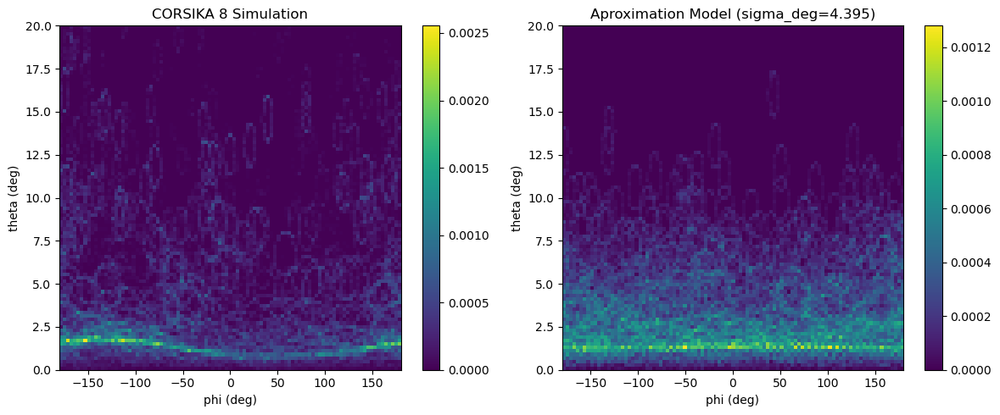

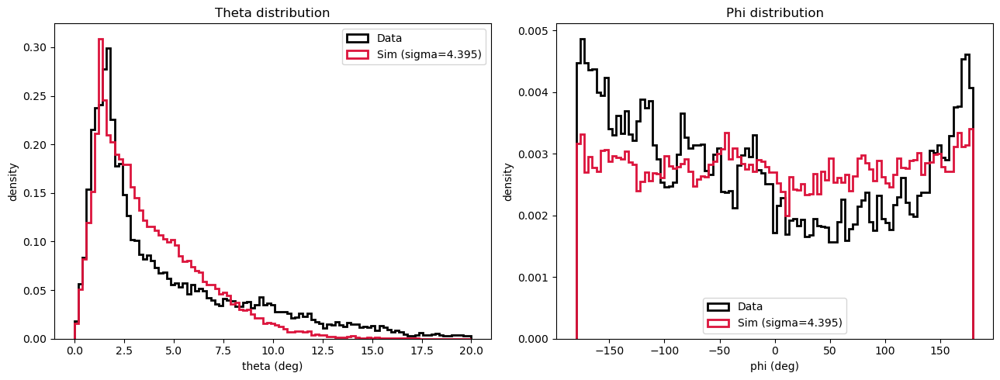

In [99]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize_scalar
import pickle
import numpy as np
#Collect data:
import glob
import os
import re
import sys
sys.path.append('/uufs/chpc.utah.edu/common/home/u1520754/Muon_Trinity/analysis/')

import numpy as np
import pandas as pd
import pickle

from ReadTrinity import read_cherenkov_hits

# ── Config ─────────────────────────────────────────────────────────────────────
Zen_max = 90.0
Zen_min = 89.9
Az_max = 270.0
Az_min = 270.0

PE_THRESHOLD = 20
DELTA_PE = 200
BASE_DIR = "/scratch/general/vast/u1520754/muon_sim_chain_tree"

ENERGY_MIN_GEV = 1e2
ENERGY_MAX_GEV = 1e6

ZEN_FILTER = None
AZ_FILTER = None
HEIGHT_FILTER = None
TEL_X_FILTER = None
TEL_Z_FILTER = None
SEED_FILTER = None
particle_id = 13
radius = 5
y = 0
# ── Load the pickle file ────────────────────────────────────────────────────
input_pkl = ("/uufs/chpc.utah.edu/common/home/u1520754/Muon_Trinity/analysis/"
    f"cherenkov_hits_pid{particle_id}_E{ENERGY_MIN_GEV:.3g}-{ENERGY_MAX_GEV:.3g}_"
    f"R{radius}_thr{PE_THRESHOLD:.0f}.pkl"
)

with open(input_pkl, "rb") as f:
    cherenkov_data_store = pickle.load(f)

print(f"Loaded {len(cherenkov_data_store)} events.")
event = cherenkov_data_store[0]   # first event
print(event["label"] )
event["label"]        # string description
event["E_str"]         # energy string
event["seed"]          # seed number
event["zen"], event["az"]   # zenith/azimuth strings
event["h"], event["x"], event["z"]  # height/tel position strings

event["X"]             # numpy array, hit X position
event["Y"]             # numpy array, hit Y position
event["T"]             # numpy array, hit time
event["cos_X"]         # numpy array, direction cosine X
event["cos_Y"]         # numpy array, direction cosine Y
event["wavelength"]    # numpy array
event["zem"]           # numpy array, emission height
event["Theta_z"]       # numpy array
event["Phi"]           # numpy array
event["Slant"]         # numpy array
event["Weight"]        # numpy array
# =============================================================
# 1) Build the DATA 2D histogram (phi, theta) with FIXED binning
# =============================================================
x_img, y_img, v_rx, v_ry, v_rz = analytical_DC_optics(event["X"], event["Y"], event["cos_X"], event["cos_Y"], R=150)
r_img = np.sqrt(x_img**2 + y_img**2)
R_event = np.sqrt(event["X"]**2 + event["Y"]**2)
mask = (R_event <= 56) #&(r_img<=5)
event_cos_Z = np.sqrt(1 - event["cos_X"]**2 - event["cos_Y"]**2)
event_theta_Z_rad = np.arccos(event_cos_Z)
event_theta_Z_deg = np.degrees(event_theta_Z_rad)[mask]

event_phi_rad = np.arctan2(event["cos_Y"], event["cos_X"])
event_phi_deg = np.degrees(event_phi_rad)[mask]

# Fixed bin edges - choose ranges that cover your data well
phi_edges = np.linspace(-180, 180, 100)
theta_edges = np.linspace(0, 20, 100)   # adjust upper theta limit to your data range

data_hist, _, _ = np.histogram2d(
    event_phi_deg, event_theta_Z_deg,
    bins=[phi_edges, theta_edges],
    density=True
)

# =============================================================
# 2) Function to build the SIMULATED 2D histogram for a given sigma_deg
# =============================================================
def rotate_to_tilted_axis(cx, cy, cz, tilt_angle, tilt_phi):
    cx1 = cx*np.cos(-tilt_phi) - cy*np.sin(-tilt_phi)
    cy1 = cx*np.sin(-tilt_phi) + cy*np.cos(-tilt_phi)
    cz1 = cz

    cx2 = cx1*np.cos(tilt_angle) + cz1*np.sin(tilt_angle)
    cy2 = cy1
    cz2 = -cx1*np.sin(tilt_angle) + cz1*np.cos(tilt_angle)

    cx3 = cx2*np.cos(tilt_phi) - cy2*np.sin(tilt_phi)
    cy3 = cx2*np.sin(tilt_phi) + cy2*np.cos(tilt_phi)
    cz3 = cz2

    return cx3, cy3, cz3

cone_angle = np.radians(1.3)
alpha_vals = np.linspace(0, 2*np.pi, 50)
alpha_grid = alpha_vals  # 1D is fine here since we don't need r

cx_p = np.sin(cone_angle) * np.cos(alpha_grid)
cy_p = np.sin(cone_angle) * np.sin(alpha_grid)
cz_p = np.cos(cone_angle) * np.ones_like(alpha_grid)

N_electrons = 1000     # increase for smoother simulated histogram
tilt_deg_fixed = 0   # set to whatever muon tilt you are simulating (deg)

def simulate_hist(sigma_deg, seed=42, return_arrays=False):
    rng = np.random.default_rng(seed)

    electron_tilt_deg = rng.normal(loc=tilt_deg_fixed, scale=sigma_deg, size=N_electrons)
    electron_tilt_phi = rng.uniform(0, 2*np.pi, size=N_electrons) #rng.normal(loc=0, scale=sigma_deg, size=N_electrons)

    theta_list = []
    phi_list = []

    for e_tilt_deg, e_tilt_phi in zip(electron_tilt_deg, electron_tilt_phi):
        tilt_angle = np.radians(e_tilt_deg)
        cx_lab, cy_lab, cz_lab = rotate_to_tilted_axis(cx_p, cy_p, cz_p, tilt_angle, e_tilt_phi)

        theta_grid = np.degrees(np.arccos(cz_lab))
        phi_grid = np.degrees(np.arctan2(cy_lab, cx_lab))

        theta_list.append(theta_grid)
        phi_list.append(phi_grid)

    theta_arr = np.concatenate(theta_list)
    phi_arr = np.concatenate(phi_list)

    sim_hist, _, _ = np.histogram2d(
        phi_arr, theta_arr,
        bins=[phi_edges, theta_edges],
        density=True
    )

    if return_arrays:
        return sim_hist, theta_arr, phi_arr
    return sim_hist

# =============================================================
# 3) Define a loss function: chi-square (or sum of squared diff)
#    between simulated and data histograms
# =============================================================
def loss(sigma_deg):
    if sigma_deg <= 0:
        return 1e10
    sim_hist = simulate_hist(sigma_deg)

    # normalize both to unit sum to compare *shapes*
    d = data_hist / data_hist.sum()
    s = sim_hist / sim_hist.sum() if sim_hist.sum() > 0 else sim_hist

    # simple sum of squared differences (could also use chi-square with errors)
    return np.sum((d - s)**2)

# =============================================================
# 4) Minimize over sigma_deg
# =============================================================
result = minimize_scalar(loss, bounds=(0.01, 20), method="bounded")

best_sigma = result.x
print(f"Best-fit sigma_deg = {best_sigma:.4f}")
print(f"Loss at minimum = {result.fun:.6e}")

# =============================================================
# 5) Compare data vs best-fit simulation visually (2D histograms)
# =============================================================
best_sim_hist, best_theta_arr, best_phi_arr = simulate_hist(best_sigma, return_arrays=True)
#best_sim_hist, best_theta_arr, best_phi_arr = simulate_hist(0.01, return_arrays=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

im0 = axes[0].imshow(
    data_hist.T, origin="lower", aspect="auto",
    extent=[phi_edges[0], phi_edges[-1], theta_edges[0], theta_edges[-1]]
)
axes[0].set_title("CORSIKA 8 Simulation")
axes[0].set_xlabel("phi (deg)")
axes[0].set_ylabel("theta (deg)")
plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(
    best_sim_hist.T, origin="lower", aspect="auto",
    extent=[phi_edges[0], phi_edges[-1], theta_edges[0], theta_edges[-1]]
)
axes[1].set_title(f"Aproximation Model (sigma_deg={best_sigma:.3f})")
axes[1].set_xlabel("phi (deg)")
axes[1].set_ylabel("theta (deg)")
plt.colorbar(im1, ax=axes[1])

plt.tight_layout()
plt.show()

# =============================================================
# 6) Compare data vs best-fit simulation: 1D marginal histograms
#    (theta and phi overlaid separately)
# =============================================================
theta_centers = 0.5 * (theta_edges[:-1] + theta_edges[1:])
phi_centers = 0.5 * (phi_edges[:-1] + phi_edges[1:])

fig, axes = plt.subplots(1, 2, figsize=(13, 5))

# --- Theta marginal ---
axes[0].hist(
    event_theta_Z_deg, bins=theta_edges, density=True,
    histtype="step", linewidth=2, label="Data", color="black"
)
axes[0].hist(
    best_theta_arr, bins=theta_edges, density=True,
    histtype="step", linewidth=2, label=f"Sim (sigma={best_sigma:.3f})", color="crimson"
)
axes[0].set_xlabel("theta (deg)")
axes[0].set_ylabel("density")
axes[0].set_title("Theta distribution")
axes[0].legend()

# --- Phi marginal ---
axes[1].hist(
    event_phi_deg, bins=phi_edges, density=True,
    histtype="step", linewidth=2, label="Data", color="black"
)
axes[1].hist(
    best_phi_arr, bins=phi_edges, density=True,
    histtype="step", linewidth=2, label=f"Sim (sigma={best_sigma:.3f})", color="crimson"
)
axes[1].set_xlabel("phi (deg)")
axes[1].set_ylabel("density")
axes[1].set_title("Phi distribution")
axes[1].legend()

plt.tight_layout()
plt.show()

In [42]:
# Max Intensity per incidence angle (model)
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "notebook"

n_r, n_alpha = 50, 50
r_vals = np.linspace(0, 56, n_r)
alpha_vals = np.linspace(0, 2*np.pi, n_alpha)
dr = r_vals[1] - r_vals[0]
dalpha = alpha_vals[1] - alpha_vals[0]
r_grid, alpha_grid = np.meshgrid(r_vals, alpha_vals)  # shape (n_alpha, n_r)

cone_angle = np.radians(1.3)
R_val = 150

N_electrons = 100
sigma_deg = 5

sin_cone = np.sin(cone_angle)
cos_cone = np.cos(cone_angle)
cx_p = sin_cone * np.cos(alpha_grid)   # (n_alpha, n_r)
cy_p = sin_cone * np.sin(alpha_grid)
cz_p = cos_cone

tilt_angles_deg = np.linspace(0, 5, 31)

n_bins = 16
x_edges = np.linspace(-5, 5, n_bins + 1)
y_edges = np.linspace(-5, 5, n_bins + 1)
x_centers = 0.5 * (x_edges[:-1] + x_edges[1:])
y_centers = 0.5 * (y_edges[:-1] + y_edges[1:])

rng = np.random.default_rng(42)

frames = []

# Broadcast shapes: electrons axis added as leading axis -> (N_electrons, 1, 1)
cx_p_b = cx_p[None, :, :]
cy_p_b = cy_p[None, :, :]
r_grid_b = r_grid[None, :, :]
alpha_grid_b = alpha_grid[None, :, :]

for tilt_deg in tilt_angles_deg:
    electron_tilt_deg = rng.normal(loc=tilt_deg, scale=sigma_deg, size=N_electrons)
    electron_tilt_phi = rng.uniform(0, 2*np.pi, size=N_electrons)

    tilt_angle = np.radians(electron_tilt_deg)[:, None, None]  # (N,1,1)
    tilt_phi = electron_tilt_phi[:, None, None]                # (N,1,1)

    ct, st = np.cos(tilt_angle), np.sin(tilt_angle)
    cp, sp = np.cos(tilt_phi), np.sin(tilt_phi)

    # Combined rotation matrix elements, each shape (N,1,1)
    R00 = cp*cp*ct + sp*sp
    R01 = cp*sp*(ct - 1)
    R02 = cp*st
    R10 = cp*sp*(ct - 1)
    R11 = sp*sp*ct + cp*cp
    R12 = sp*st
    R20 = -cp*st
    R21 = -sp*st
    R22 = ct

    cx_lab = R00*cx_p_b + R01*cy_p_b + R02*cz_p
    cy_lab = R10*cx_p_b + R11*cy_p_b + R12*cz_p
    cz_lab = R20*cx_p_b + R21*cy_p_b + R22*cz_p

    theta_grid = np.arccos(cz_lab)          # (N, n_alpha, n_r)
    phi_grid = np.arctan2(cy_lab, cx_lab)   # (N, n_alpha, n_r)

    r_b = np.broadcast_to(r_grid_b, theta_grid.shape)
    alpha_b = np.broadcast_to(alpha_grid_b, theta_grid.shape)

    X_img = x_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    Y_img = y_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    R_img = np.hypot(X_img, Y_img)

    # gradient along r-axis (last axis), per electron slice
    dR_img_dr = np.gradient(R_img, dr, axis=2)
    dr_img = dR_img_dr * dr

    I_all = np.abs(I_func(r_b, alpha_b, theta_grid, phi_grid, R_val) * R_img * dalpha * dr_img)

    x_flat = X_img.ravel()
    y_flat = Y_img.ravel()
    I_flat = I_all.ravel()

    mask = np.isfinite(x_flat) & np.isfinite(y_flat) & np.isfinite(I_flat)

    H_total, _, _ = np.histogram2d(
        x_flat[mask], y_flat[mask],
        bins=[x_edges, y_edges],
        weights=I_flat[mask]
    )
    H_total = H_total.T

    frames.append(go.Frame(
        data=[go.Heatmap(z=H_total, x=x_centers, y=y_centers, colorscale='Turbo',
                          colorbar=dict(title='Sum Intensity'))],
        name=f"{tilt_deg:.2f}"
    ))

fig = go.Figure(
    data=frames[0].data,
    frames=frames
)

fig.update_layout(
    title=f"Binned Intensity Heat Map vs Tilt Angle (N={N_electrons} electrons, sigma={sigma_deg} deg)",
    xaxis_title="x",
    yaxis_title="y",
    xaxis=dict(range=[-5, 5], scaleanchor="y"),
    yaxis=dict(range=[-5, 5]),
    width=650,
    height=650,
    sliders=[{
        "steps": [
            {
                "args": [[f.name], {"frame": {"duration": 0, "redraw": True},
                                     "mode": "immediate"}],
                "label": f.name,
                "method": "animate"
            } for f in frames
        ],
        "currentvalue": {"prefix": "Tilt angle (deg): "}
    }],
    updatemenus=[{
        "type": "buttons",
        "buttons": [{
            "label": "Play",
            "method": "animate",
            "args": [None, {"frame": {"duration": 200, "redraw": True},
                             "fromcurrent": True}]
        }]
    }]
)

fig.show()

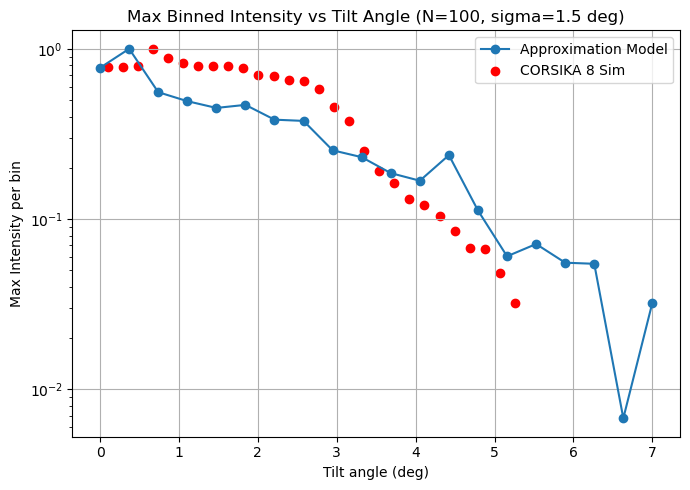

In [97]:
# Max Intensity per bin vs Tilt Angle (model)
import numpy as np
import matplotlib.pyplot as plt

n_r, n_alpha = 50, 50
r_vals = np.linspace(0, 56, n_r)
alpha_vals = np.linspace(0, 2*np.pi, n_alpha)
dr = r_vals[1] - r_vals[0]
dalpha = alpha_vals[1] - alpha_vals[0]
r_grid, alpha_grid = np.meshgrid(r_vals, alpha_vals)  # (n_alpha, n_r)

cone_angle = np.radians(1.3)
R_val = 150

N_electrons = 100
sigma_deg = 1.5

sin_cone = np.sin(cone_angle)
cos_cone = np.cos(cone_angle)
cx_p = sin_cone * np.cos(alpha_grid)
cy_p = sin_cone * np.sin(alpha_grid)
cz_p = cos_cone

tilt_angles_deg = np.linspace(0, 7, 20)

n_bins = 16
x_edges = np.linspace(-5, 5, n_bins + 1)
y_edges = np.linspace(-5, 5, n_bins + 1)

rng = np.random.default_rng(42)

max_I_per_tilt = []

cx_p_b = cx_p[None, :, :]
cy_p_b = cy_p[None, :, :]
r_grid_b = r_grid[None, :, :]
alpha_grid_b = alpha_grid[None, :, :]

for tilt_deg in tilt_angles_deg:
    electron_tilt_deg = rng.normal(loc=tilt_deg, scale=sigma_deg, size=N_electrons)
    electron_tilt_phi = rng.uniform(0, 2*np.pi, size=N_electrons)

    tilt_angle = np.radians(electron_tilt_deg)[:, None, None]
    tilt_phi = electron_tilt_phi[:, None, None]

    ct, st = np.cos(tilt_angle), np.sin(tilt_angle)
    cp, sp = np.cos(tilt_phi), np.sin(tilt_phi)

    R00 = cp*cp*ct + sp*sp
    R01 = cp*sp*(ct - 1)
    R02 = cp*st
    R10 = cp*sp*(ct - 1)
    R11 = sp*sp*ct + cp*cp
    R12 = sp*st
    R20 = -cp*st
    R21 = -sp*st
    R22 = ct

    cx_lab = R00*cx_p_b + R01*cy_p_b + R02*cz_p
    cy_lab = R10*cx_p_b + R11*cy_p_b + R12*cz_p
    cz_lab = R20*cx_p_b + R21*cy_p_b + R22*cz_p

    theta_grid = np.arccos(cz_lab)
    phi_grid = np.arctan2(cy_lab, cx_lab)

    r_b = np.broadcast_to(r_grid_b, theta_grid.shape)
    alpha_b = np.broadcast_to(alpha_grid_b, theta_grid.shape)

    X_img = x_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    Y_img = y_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    R_img = np.hypot(X_img, Y_img)

    dR_img_dr = np.gradient(R_img, dr, axis=2)
    dr_img = dR_img_dr * dr

    I_all = np.abs(I_func(r_b, alpha_b, theta_grid, phi_grid, R_val) * R_img * dalpha * dr_img)

    x_flat = X_img.ravel()
    y_flat = Y_img.ravel()
    I_flat = I_all.ravel()

    mask = np.isfinite(x_flat) & np.isfinite(y_flat) & np.isfinite(I_flat)

    H_total, _, _ = np.histogram2d(
        x_flat[mask], y_flat[mask],
        bins=[x_edges, y_edges],
        weights=I_flat[mask]
    )
    max_I_per_tilt.append(H_total.max())
    #max_I_per_tilt.append(np.median(H_total))

max_I_per_tilt = np.array(max_I_per_tilt)

# --- Plot ---
plt.figure(figsize=(7, 5))
plt.plot(tilt_angles_deg, max_I_per_tilt/max(max_I_per_tilt), marker='o', label="Approximation Model")
plt.scatter(inc_arr, B_fit_arr*(1/max(B_fit_arr)), label="CORSIKA 8 Sim", c ="red")
plt.legend()
plt.yscale("log")
plt.xlabel("Tilt angle (deg)")
plt.ylabel("Max Intensity per bin")
plt.title(f"Max Binned Intensity vs Tilt Angle (N={N_electrons}, sigma={sigma_deg} deg)")
plt.grid(True)
plt.tight_layout()
plt.show()

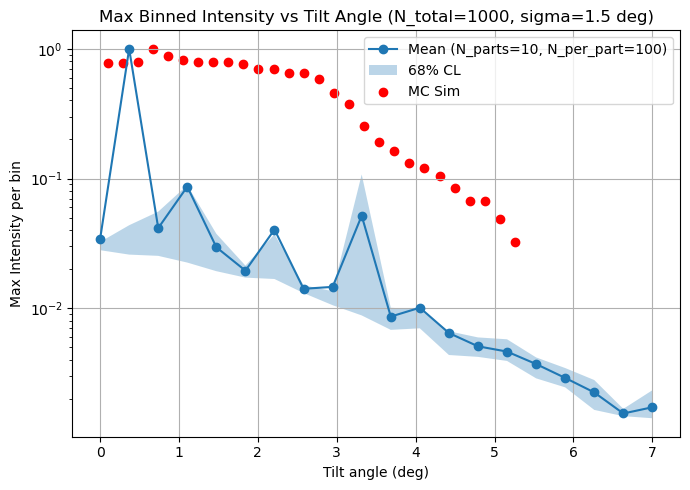

In [64]:
# Max Intensity per bin vs Tilt Angle (model), with sub-sampling for mean & 68% CL
import numpy as np
import matplotlib.pyplot as plt

n_r, n_alpha = 50, 50
r_vals = np.linspace(0, 56, n_r)
alpha_vals = np.linspace(0, 2*np.pi, n_alpha)
dr = r_vals[1] - r_vals[0]
dalpha = alpha_vals[1] - alpha_vals[0]
r_grid, alpha_grid = np.meshgrid(r_vals, alpha_vals)  # (n_alpha, n_r)

cone_angle = np.radians(1.3)
R_val = 150

# --- Adjustable electron statistics ---
N_electrons_total = 1000   # total electrons per incidence angle
N_parts = 10              # number of even sub-samples
assert N_electrons_total % N_parts == 0, "N_electrons_total must be divisible by N_parts"
N_per_part = N_electrons_total // N_parts

sigma_deg = 1.5

sin_cone = np.sin(cone_angle)
cos_cone = np.cos(cone_angle)
cx_p = sin_cone * np.cos(alpha_grid)
cy_p = sin_cone * np.sin(alpha_grid)
cz_p = cos_cone

tilt_angles_deg = np.linspace(0, 7, 20)

n_bins = 16
x_edges = np.linspace(-5, 5, n_bins + 1)
y_edges = np.linspace(-5, 5, n_bins + 1)

rng = np.random.default_rng(42)

cx_p_b = cx_p[None, :, :]
cy_p_b = cy_p[None, :, :]
r_grid_b = r_grid[None, :, :]
alpha_grid_b = alpha_grid[None, :, :]

mean_I_per_tilt = []
lo_I_per_tilt = []   # 16th percentile (68% CL lower)
hi_I_per_tilt = []   # 84th percentile (68% CL upper)

def compute_I_max(electron_tilt_deg, electron_tilt_phi):
    """Compute the binned max intensity for a given set of electron angles."""
    tilt_angle = np.radians(electron_tilt_deg)[:, None, None]
    tilt_phi = electron_tilt_phi[:, None, None]

    ct, st = np.cos(tilt_angle), np.sin(tilt_angle)
    cp, sp = np.cos(tilt_phi), np.sin(tilt_phi)

    R00 = cp*cp*ct + sp*sp
    R01 = cp*sp*(ct - 1)
    R02 = cp*st
    R10 = cp*sp*(ct - 1)
    R11 = sp*sp*ct + cp*cp
    R12 = sp*st
    R20 = -cp*st
    R21 = -sp*st
    R22 = ct

    cx_lab = R00*cx_p_b + R01*cy_p_b + R02*cz_p
    cy_lab = R10*cx_p_b + R11*cy_p_b + R12*cz_p
    cz_lab = R20*cx_p_b + R21*cy_p_b + R22*cz_p

    theta_grid = np.arccos(cz_lab)
    phi_grid = np.arctan2(cy_lab, cx_lab)

    r_b = np.broadcast_to(r_grid_b, theta_grid.shape)
    alpha_b = np.broadcast_to(alpha_grid_b, theta_grid.shape)

    X_img = x_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    Y_img = y_func(r_b, alpha_b, theta_grid, phi_grid, R_val)
    R_img = np.hypot(X_img, Y_img)

    dR_img_dr = np.gradient(R_img, dr, axis=2)
    dr_img = dR_img_dr * dr

    I_all = np.abs(I_func(r_b, alpha_b, theta_grid, phi_grid, R_val) * R_img * dalpha * dr_img)

    x_flat = X_img.ravel()
    y_flat = Y_img.ravel()
    I_flat = I_all.ravel()

    mask = np.isfinite(x_flat) & np.isfinite(y_flat) & np.isfinite(I_flat)

    H_total, _, _ = np.histogram2d(
        x_flat[mask], y_flat[mask],
        bins=[x_edges, y_edges],
        weights=I_flat[mask]
    )
    return H_total.max()

for tilt_deg in tilt_angles_deg:
    # draw the full pool of electrons for this tilt angle
    electron_tilt_deg_all = rng.normal(loc=tilt_deg, scale=sigma_deg, size=N_electrons_total)
    electron_tilt_phi_all = rng.uniform(0, 2*np.pi, size=N_electrons_total)

    part_I_max = []
    for i in range(N_parts):
        sl = slice(i * N_per_part, (i + 1) * N_per_part)
        I_max_part = compute_I_max(electron_tilt_deg_all[sl], electron_tilt_phi_all[sl])
        part_I_max.append(I_max_part)

    part_I_max = np.array(part_I_max)

    mean_I_per_tilt.append(part_I_max.mean())
    lo_I_per_tilt.append(np.percentile(part_I_max, 16))
    hi_I_per_tilt.append(np.percentile(part_I_max, 84))

mean_I_per_tilt = np.array(mean_I_per_tilt)
lo_I_per_tilt = np.array(lo_I_per_tilt)
hi_I_per_tilt = np.array(hi_I_per_tilt)

# --- Normalize by the max of the mean curve ---
norm = mean_I_per_tilt.max()
mean_n = mean_I_per_tilt / norm
lo_n = lo_I_per_tilt / norm
hi_n = hi_I_per_tilt / norm

# --- Plot ---
plt.figure(figsize=(7, 5))
plt.plot(tilt_angles_deg, mean_n, marker='o', label=f"Mean (N_parts={N_parts}, N_per_part={N_per_part})")
plt.fill_between(tilt_angles_deg, lo_n, hi_n, alpha=0.3, label="68% CL")
plt.scatter(inc_arr, B_fit_arr / max(B_fit_arr), label="MC Sim", c="red")
plt.legend()
plt.yscale("log")
plt.xlabel("Tilt angle (deg)")
plt.ylabel("Max Intensity per bin")
plt.title(f"Max Binned Intensity vs Tilt Angle (N_total={N_electrons_total}, sigma={sigma_deg} deg)")
plt.grid(True)
plt.tight_layout()
plt.show()